# PROBLEM STATEMENT

- A US based housing company named surprise housing company decided to enter australian market. In order to do that, they want to understand the prefereces of australian market; as in,

`BUSINESS GOAL`
1. how the pricing is related to various features related to the house
2. a model to predict the features that affect pricing of the house. 

#### once this is achieved, they can use the model to their advantage.

### Analysis Approach

1. Reading and understanding Data - basic inspection
2. Data Cleaning - Handling missing values, dropping unwanted columns
3. Perform Outlier treatment - capping or dropping
4. Data Preparation - perform EDA, one hot encoding(dummy variable creation), scaling and perform train test split - 
5. Modelling - feature selection using RFE; and then Lasso and Ridge regression
6. Performance testing
7. Predict top ten features
8. Conclusion

#### READING AND UNDERSTANDING DATA

In [1]:
#---------- importing required librarires for initial analysis ---------- 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#---------- display options ---------- 

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

pd.options.display.float_format='{:.4f}'.format

sns.set_style("whitegrid")

plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16

#---------- filtering warnings ---------- 

import warnings
warnings.filterwarnings("ignore")

In [2]:
#Reeading the csv file to dataframe name 'house'

house = pd.read_csv("train.csv")

In [3]:
#displaying first few rows

house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
#checking the shape

print("\033[1mno of (rows, columns) in the dataframe\033[0m", house.shape)

#there are 1460 rows and 81 columns

no of (rows, columns) in the dataframe (1460, 81)


In [5]:
#statistical info of numerical columns

house.describe()

#presence of outliers can be detected in some columns

#mean, min, max and all quantile values can be seeen

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.0000,1460.0000,1201.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1452.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1379.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000,1460.0000
mean,730.5000,56.8973,70.0500,10516.8281,6.0993,5.5753,1971.2678,1984.8658,103.6853,443.6397,46.5493,567.2404,1057.4295,1162.6267,346.9925,5.8445,1515.4637,0.4253,0.0575,1.5651,0.3829,2.8664,1.0466,6.5178,0.6130,1978.5062,1.7671,472.9801,94.2445,46.6603,21.9541,3.4096,15.0610,2.7589,43.4890,6.3219,2007.8158,180921.1959
std,421.6100,42.3006,24.2848,9981.2649,1.3830,1.1128,30.2029,20.6454,181.0662,456.0981,161.3193,441.8670,438.7053,386.5877,436.5284,48.6231,525.4804,0.5189,0.2388,0.5509,0.5029,0.8158,0.2203,1.6254,0.6447,24.6897,0.7473,213.8048,125.3388,66.2560,61.1191,29.3173,55.7574,40.1773,496.1230,2.7036,1.3281,79442.5029
min,1.0000,20.0000,21.0000,1300.0000,1.0000,1.0000,1872.0000,1950.0000,0.0000,0.0000,0.0000,0.0000,0.0000,334.0000,0.0000,0.0000,334.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,0.0000,1900.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,2006.0000,34900.0000
25%,365.7500,20.0000,59.0000,7553.5000,5.0000,5.0000,1954.0000,1967.0000,0.0000,0.0000,0.0000,223.0000,795.7500,882.0000,0.0000,0.0000,1129.5000,0.0000,0.0000,1.0000,0.0000,2.0000,1.0000,5.0000,0.0000,1961.0000,1.0000,334.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,5.0000,2007.0000,129975.0000
50%,730.5000,50.0000,69.0000,9478.5000,6.0000,5.0000,1973.0000,1994.0000,0.0000,383.5000,0.0000,477.5000,991.5000,1087.0000,0.0000,0.0000,1464.0000,0.0000,0.0000,2.0000,0.0000,3.0000,1.0000,6.0000,1.0000,1980.0000,2.0000,480.0000,0.0000,25.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.0000,2008.0000,163000.0000
75%,1095.2500,70.0000,80.0000,11601.5000,7.0000,6.0000,2000.0000,2004.0000,166.0000,712.2500,0.0000,808.0000,1298.2500,1391.2500,728.0000,0.0000,1776.7500,1.0000,0.0000,2.0000,1.0000,3.0000,1.0000,7.0000,1.0000,2002.0000,2.0000,576.0000,168.0000,68.0000,0.0000,0.0000,0.0000,0.0000,0.0000,8.0000,2009.0000,214000.0000
max,1460.0000,190.0000,313.0000,215245.0000,10.0000,9.0000,2010.0000,2010.0000,1600.0000,5644.0000,1474.0000,2336.0000,6110.0000,4692.0000,2065.0000,572.0000,5642.0000,3.0000,2.0000,3.0000,2.0000,8.0000,3.0000,14.0000,3.0000,2010.0000,4.0000,1418.0000,857.0000,547.0000,552.0000,508.0000,480.0000,738.0000,15500.0000,12.0000,2010.0000,755000.0000


In [6]:
#checking dtypes of all columns

print("\033[1mDataframe information: \033[0m")
house.info()

Dataframe information: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null

In [7]:
#checking for duplicate values

house[house.duplicated(keep = False)]

#none found

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [8]:
#checking for column wise null values

perc_null = 100*(house.isnull().sum()/len(house))

perc_null

Id               0.0000
MSSubClass       0.0000
MSZoning         0.0000
LotFrontage     17.7397
LotArea          0.0000
Street           0.0000
Alley           93.7671
LotShape         0.0000
LandContour      0.0000
Utilities        0.0000
LotConfig        0.0000
LandSlope        0.0000
Neighborhood     0.0000
Condition1       0.0000
Condition2       0.0000
BldgType         0.0000
HouseStyle       0.0000
OverallQual      0.0000
OverallCond      0.0000
YearBuilt        0.0000
YearRemodAdd     0.0000
RoofStyle        0.0000
RoofMatl         0.0000
Exterior1st      0.0000
Exterior2nd      0.0000
MasVnrType       0.5479
MasVnrArea       0.5479
ExterQual        0.0000
ExterCond        0.0000
Foundation       0.0000
BsmtQual         2.5342
BsmtCond         2.5342
BsmtExposure     2.6027
BsmtFinType1     2.5342
BsmtFinSF1       0.0000
BsmtFinType2     2.6027
BsmtFinSF2       0.0000
BsmtUnfSF        0.0000
TotalBsmtSF      0.0000
Heating          0.0000
HeatingQC        0.0000
CentralAir      

In [9]:
#looking for columns with more than 40% missing values and saving them back to 'null40'

null40 = perc_null[perc_null > 40]

null40

Alley         93.7671
FireplaceQu   47.2603
PoolQC        99.5205
Fence         80.7534
MiscFeature   96.3014
dtype: float64

In [10]:
#dropping columns with more than 40% missing values

house.drop(labels=null40.index, axis = 1, inplace = True)

In [11]:
#checking for shape again

house.shape

#column number reduced from 81 to 76. 

(1460, 76)

#### DATA CLEANING & HANDLING of MISSING VALUES IN CATEGORICAL COLUMNS + UNIVARIATE ANALYSIS

In [12]:
#dropping id column as it is not needed for analysis

house.drop('Id', axis = 1, inplace = True)

In [13]:
#defining a function to check for value counts, misisng values and mode value of all categorical columns

def handle_categ(col):
    
    print("\033[1m- Normalized value counts in "+col+" column: \033[0m")
    print(house[col].value_counts(normalize=True))
    
    print("\n")
    
    print("\033[1m- Null values present in "+col+" column: \033[0m", house[col].isnull().sum())
    
    print("\n")
    
    print("\033[1m- Mode value in "+col+" column: \033[0m", house[col].mode()[0])
    
    print("\n")
    
    w = house[col].nunique() #to get the width for plot
    
    if w<5:
        plt.figure(figsize=(6,5))
    else:
        plt.figure(figsize=(w,6))
    
    sns.countplot(house[col])
    plt.title("Analysis on "+col, weight = 'bold')
    plt.xticks(rotation=90)
    plt.show()
    

- Normalized value counts in MSZoning column: 
RL        0.7884
RM        0.1493
FV        0.0445
RH        0.0110
C (all)   0.0068
Name: MSZoning, dtype: float64


- Null values present in MSZoning column:  0


- Mode value in MSZoning column:  RL




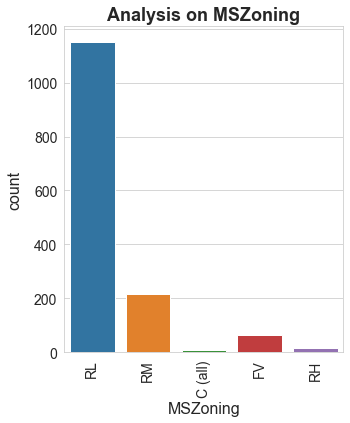

In [14]:
handle_categ("MSZoning")

#column not skewed to any particular value
#no null values

- Normalized value counts in Street column: 
Pave   0.9959
Grvl   0.0041
Name: Street, dtype: float64


- Null values present in Street column:  0


- Mode value in Street column:  Pave




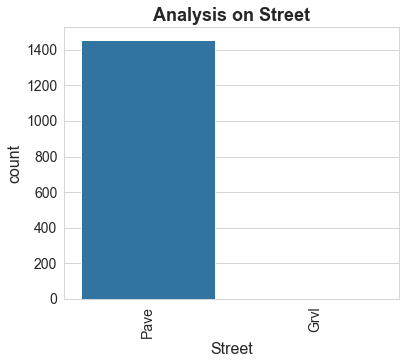

In [15]:
handle_categ("Street")

#since this is a skewed column, we will be adding this to a list of unwanted / skewed columns which will be dropped later

In [16]:
#creating  a list of columns to be deleted based on data skewenes

skewed_cols = []
skewed_cols.append("Street")
skewed_cols

['Street']

- Normalized value counts in LotShape column: 
Reg   0.6336
IR1   0.3315
IR2   0.0281
IR3   0.0068
Name: LotShape, dtype: float64


- Null values present in LotShape column:  0


- Mode value in LotShape column:  Reg




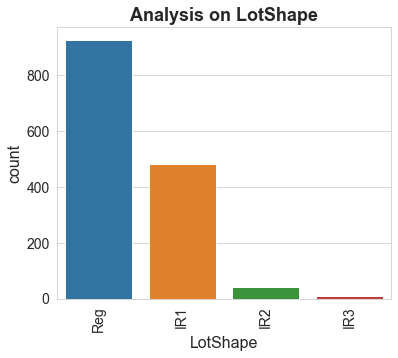

In [17]:
handle_categ("LotShape")

#column not skewed to any particular value
#no null values

- Normalized value counts in LandContour column: 
Lvl   0.8979
Bnk   0.0432
HLS   0.0342
Low   0.0247
Name: LandContour, dtype: float64


- Null values present in LandContour column:  0


- Mode value in LandContour column:  Lvl




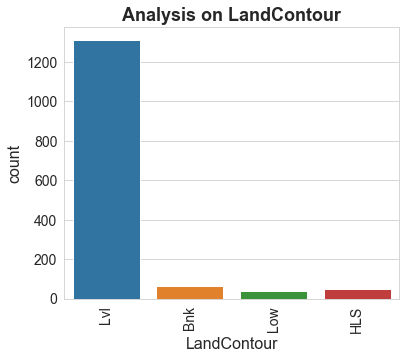

In [18]:
handle_categ("LandContour")

#column not skewed to any particular value
#no null values

- Normalized value counts in Utilities column: 
AllPub   0.9993
NoSeWa   0.0007
Name: Utilities, dtype: float64


- Null values present in Utilities column:  0


- Mode value in Utilities column:  AllPub




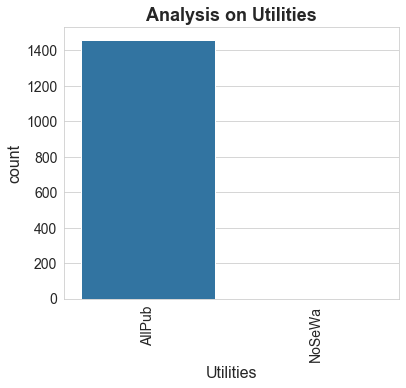

In [19]:
handle_categ("Utilities")

#values skewed to AllPub 

In [20]:
#adding "Utilities" column to skewed_cols

skewed_cols.append("Utilities")
skewed_cols

['Street', 'Utilities']

- Normalized value counts in LotConfig column: 
Inside    0.7205
Corner    0.1801
CulDSac   0.0644
FR2       0.0322
FR3       0.0027
Name: LotConfig, dtype: float64


- Null values present in LotConfig column:  0


- Mode value in LotConfig column:  Inside




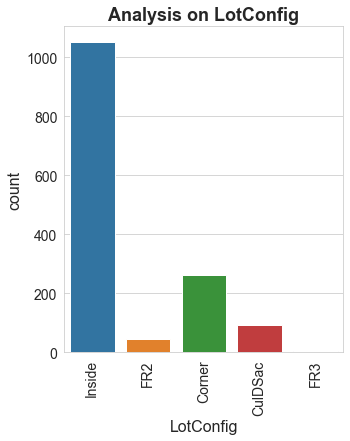

In [21]:
handle_categ("LotConfig")

#column not skewed to any particular value
#no null values

- Normalized value counts in LandSlope column: 
Gtl   0.9466
Mod   0.0445
Sev   0.0089
Name: LandSlope, dtype: float64


- Null values present in LandSlope column:  0


- Mode value in LandSlope column:  Gtl




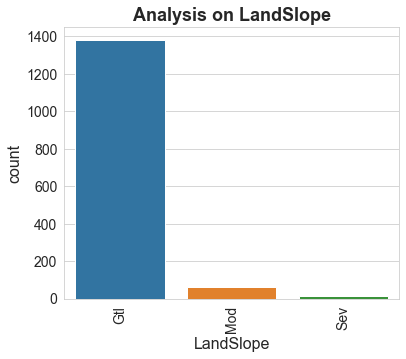

In [22]:
handle_categ("LandSlope")

#data skewed

In [23]:
#adding "LandSlope" column to skewed_cols

skewed_cols.append("LandSlope")
skewed_cols

['Street', 'Utilities', 'LandSlope']

- Normalized value counts in Neighborhood column: 
NAmes     0.1541
CollgCr   0.1027
OldTown   0.0774
Edwards   0.0685
Somerst   0.0589
Gilbert   0.0541
NridgHt   0.0527
Sawyer    0.0507
NWAmes    0.0500
SawyerW   0.0404
BrkSide   0.0397
Crawfor   0.0349
Mitchel   0.0336
NoRidge   0.0281
Timber    0.0260
IDOTRR    0.0253
ClearCr   0.0192
StoneBr   0.0171
SWISU     0.0171
Blmngtn   0.0116
MeadowV   0.0116
BrDale    0.0110
Veenker   0.0075
NPkVill   0.0062
Blueste   0.0014
Name: Neighborhood, dtype: float64


- Null values present in Neighborhood column:  0


- Mode value in Neighborhood column:  NAmes




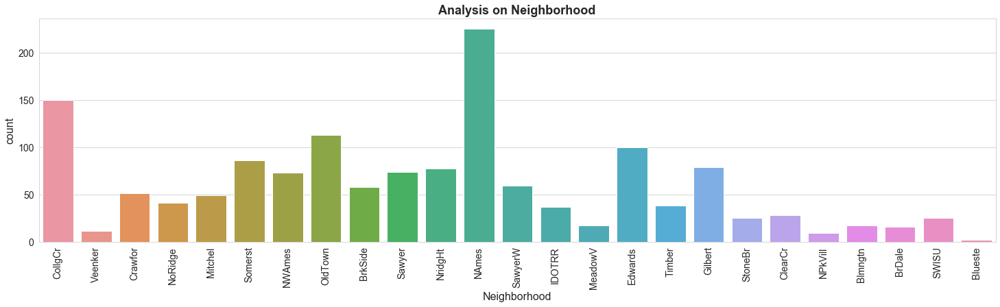

In [24]:
handle_categ("Neighborhood")

#column not skewed to any particular value
#no null values

- Normalized value counts in Condition1 column: 
Norm     0.8630
Feedr    0.0555
Artery   0.0329
RRAn     0.0178
PosN     0.0130
RRAe     0.0075
PosA     0.0055
RRNn     0.0034
RRNe     0.0014
Name: Condition1, dtype: float64


- Null values present in Condition1 column:  0


- Mode value in Condition1 column:  Norm




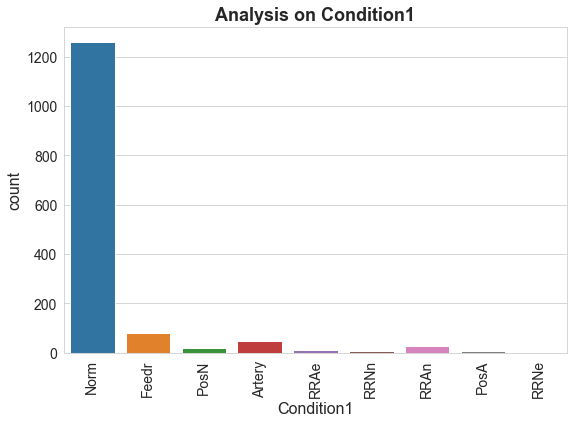

In [25]:
handle_categ("Condition1")

#column not skewed to any particular value
#no null values

- Normalized value counts in Condition2 column: 
Norm     0.9897
Feedr    0.0041
RRNn     0.0014
PosN     0.0014
Artery   0.0014
RRAn     0.0007
RRAe     0.0007
PosA     0.0007
Name: Condition2, dtype: float64


- Null values present in Condition2 column:  0


- Mode value in Condition2 column:  Norm




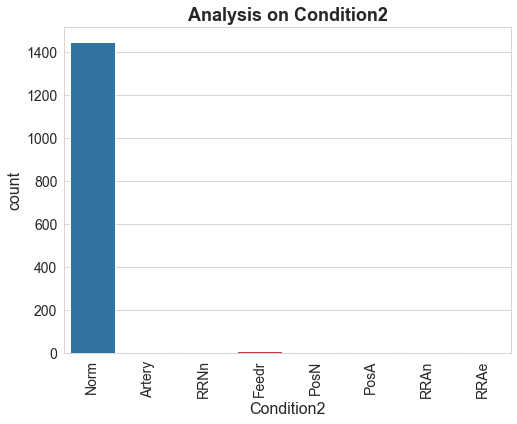

In [26]:
handle_categ("Condition2")

#data skewed; hence will be added to skewed_cols list

In [27]:
#adding "Condition2" column to skewed_cols

skewed_cols.append("Condition2")
skewed_cols

['Street', 'Utilities', 'LandSlope', 'Condition2']

- Normalized value counts in BldgType column: 
1Fam     0.8356
TwnhsE   0.0781
Duplex   0.0356
Twnhs    0.0295
2fmCon   0.0212
Name: BldgType, dtype: float64


- Null values present in BldgType column:  0


- Mode value in BldgType column:  1Fam




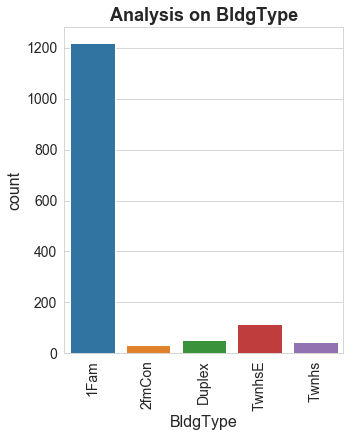

In [28]:
handle_categ("BldgType")

#column not skewed to any particular value
#no null values

- Normalized value counts in HouseStyle column: 
1Story   0.4973
2Story   0.3048
1.5Fin   0.1055
SLvl     0.0445
SFoyer   0.0253
1.5Unf   0.0096
2.5Unf   0.0075
2.5Fin   0.0055
Name: HouseStyle, dtype: float64


- Null values present in HouseStyle column:  0


- Mode value in HouseStyle column:  1Story




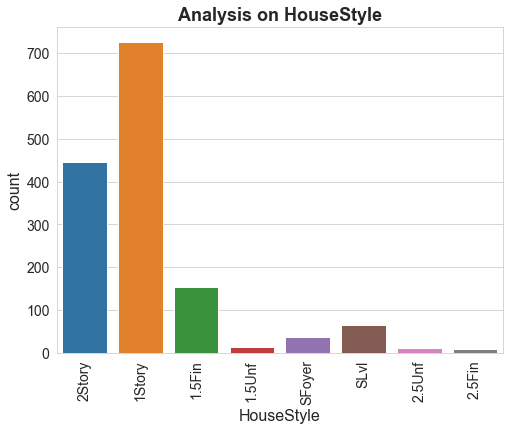

In [29]:
handle_categ("HouseStyle")

#column not skewed to any particular value
#no null values

- Normalized value counts in RoofStyle column: 
Gable     0.7815
Hip       0.1959
Flat      0.0089
Gambrel   0.0075
Mansard   0.0048
Shed      0.0014
Name: RoofStyle, dtype: float64


- Null values present in RoofStyle column:  0


- Mode value in RoofStyle column:  Gable




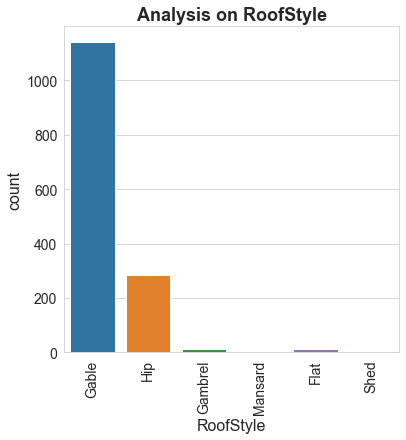

In [30]:
handle_categ("RoofStyle")

#column not skewed to any particular value
#no null values

- Normalized value counts in RoofMatl column: 
CompShg   0.9822
Tar&Grv   0.0075
WdShngl   0.0041
WdShake   0.0034
Roll      0.0007
Metal     0.0007
Membran   0.0007
ClyTile   0.0007
Name: RoofMatl, dtype: float64


- Null values present in RoofMatl column:  0


- Mode value in RoofMatl column:  CompShg




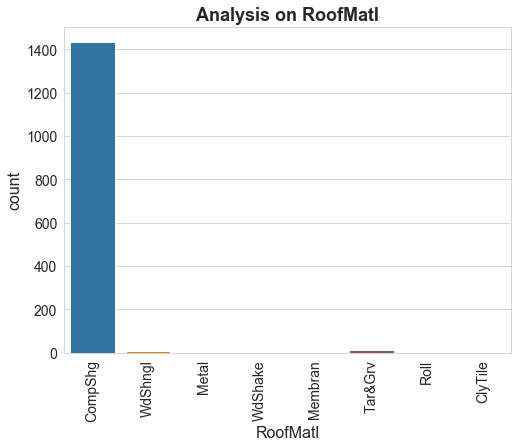

In [31]:
handle_categ("RoofMatl")

#data skewed; hence will be added to skewed_cols

In [32]:
#adding "RoofMatl" column to skewed_cols

skewed_cols.append("RoofMatl")
skewed_cols

['Street', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl']

- Normalized value counts in Exterior1st column: 
VinylSd   0.3527
HdBoard   0.1521
MetalSd   0.1507
Wd Sdng   0.1411
Plywood   0.0740
CemntBd   0.0418
BrkFace   0.0342
WdShing   0.0178
Stucco    0.0171
AsbShng   0.0137
BrkComm   0.0014
Stone     0.0014
AsphShn   0.0007
CBlock    0.0007
ImStucc   0.0007
Name: Exterior1st, dtype: float64


- Null values present in Exterior1st column:  0


- Mode value in Exterior1st column:  VinylSd




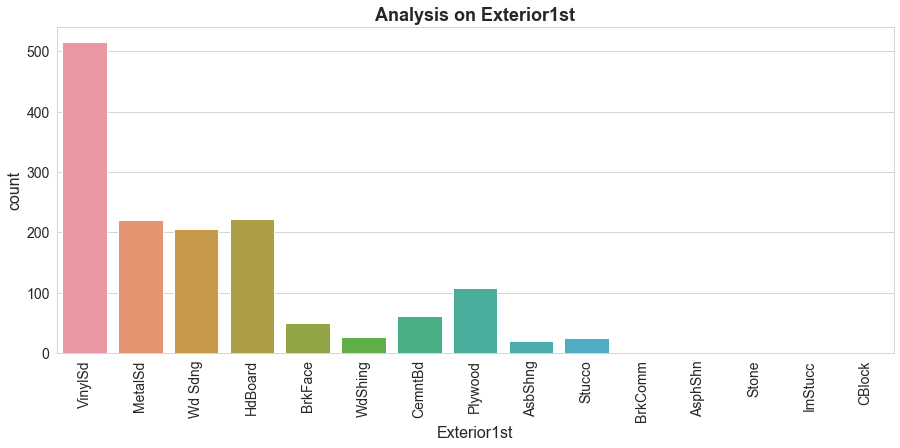

In [33]:
handle_categ("Exterior1st")

#column not skewed to any particular value
#no null values

- Normalized value counts in Exterior2nd column: 
VinylSd   0.3452
MetalSd   0.1466
HdBoard   0.1418
Wd Sdng   0.1349
Plywood   0.0973
CmentBd   0.0411
Wd Shng   0.0260
Stucco    0.0178
BrkFace   0.0171
AsbShng   0.0137
ImStucc   0.0068
Brk Cmn   0.0048
Stone     0.0034
AsphShn   0.0021
Other     0.0007
CBlock    0.0007
Name: Exterior2nd, dtype: float64


- Null values present in Exterior2nd column:  0


- Mode value in Exterior2nd column:  VinylSd




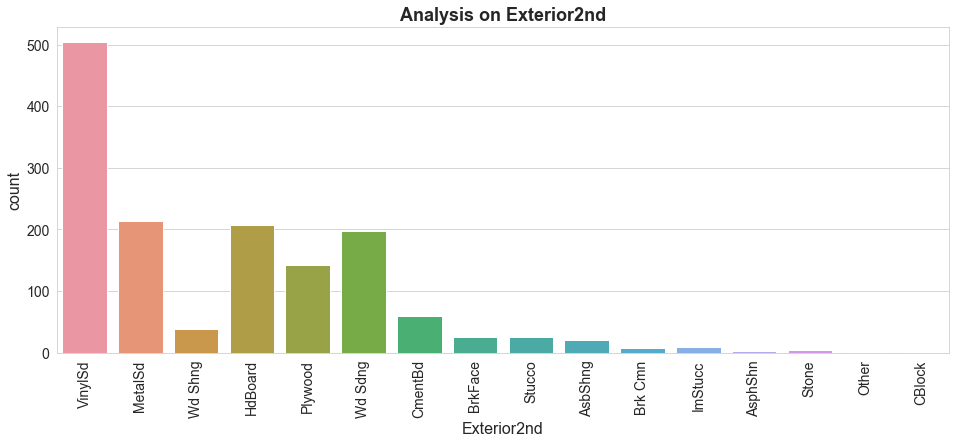

In [34]:
handle_categ("Exterior2nd")

#column not skewed to any particular value
#no null values

- Normalized value counts in MasVnrType column: 
None      0.5950
BrkFace   0.3065
Stone     0.0882
BrkCmn    0.0103
Name: MasVnrType, dtype: float64


- Null values present in MasVnrType column:  8


- Mode value in MasVnrType column:  None




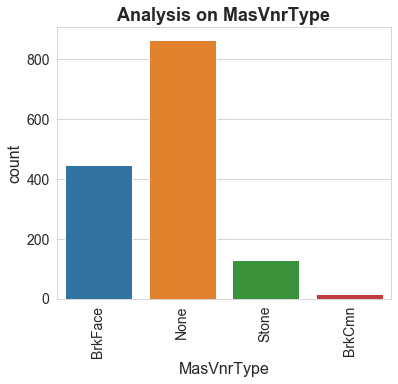

In [35]:
handle_categ("MasVnrType")

#column not skewed to any particular value

# 8 null values

In [36]:
#imputing null values with value 'no type'

house['MasVnrType'] = house['MasVnrType'].fillna("No Type")

- Normalized value counts in ExterQual column: 
TA   0.6205
Gd   0.3342
Ex   0.0356
Fa   0.0096
Name: ExterQual, dtype: float64


- Null values present in ExterQual column:  0


- Mode value in ExterQual column:  TA




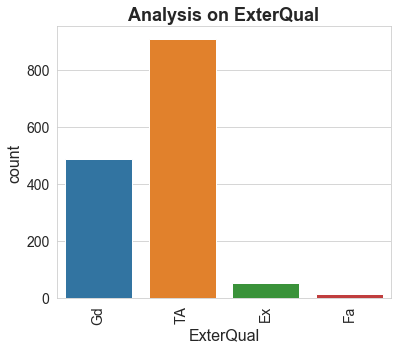

In [37]:
handle_categ("ExterQual")

#column not skewed to any particular value

#no null values

- Normalized value counts in ExterCond column: 
TA   0.8781
Gd   0.1000
Fa   0.0192
Ex   0.0021
Po   0.0007
Name: ExterCond, dtype: float64


- Null values present in ExterCond column:  0


- Mode value in ExterCond column:  TA




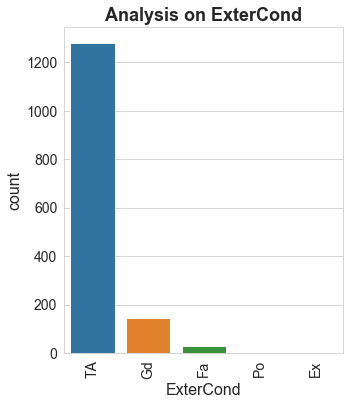

In [38]:
handle_categ("ExterCond")

#column not skewed to any particular value

#no null values

- Normalized value counts in Foundation column: 
PConc    0.4432
CBlock   0.4342
BrkTil   0.1000
Slab     0.0164
Stone    0.0041
Wood     0.0021
Name: Foundation, dtype: float64


- Null values present in Foundation column:  0


- Mode value in Foundation column:  PConc




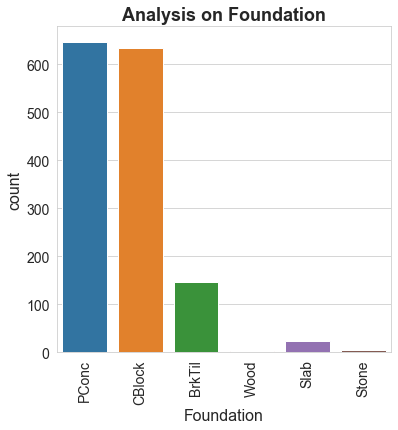

In [39]:
handle_categ("Foundation")

#column not skewed to any particular value

#no null values

- Normalized value counts in BsmtQual column: 
TA   0.4561
Gd   0.4343
Ex   0.0850
Fa   0.0246
Name: BsmtQual, dtype: float64


- Null values present in BsmtQual column:  37


- Mode value in BsmtQual column:  TA




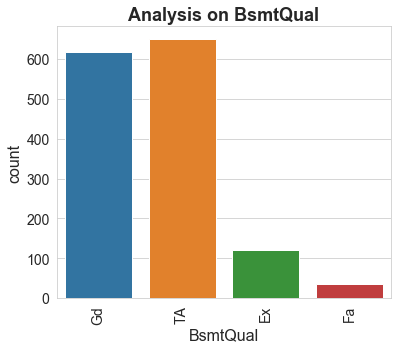

In [40]:
handle_categ("BsmtQual")

#column not skewed to any particular value
# 37 null values

In [41]:
#imputing null values with value 'no basement'

house['BsmtQual'] = house['BsmtQual'].fillna("No basement")

- Normalized value counts in BsmtCond column: 
TA   0.9213
Gd   0.0457
Fa   0.0316
Po   0.0014
Name: BsmtCond, dtype: float64


- Null values present in BsmtCond column:  37


- Mode value in BsmtCond column:  TA




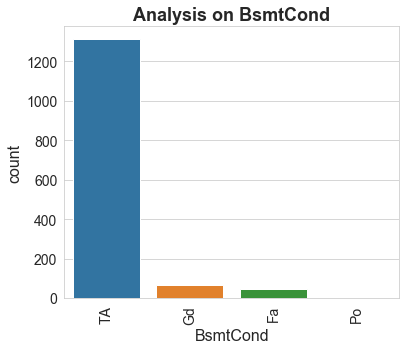

In [42]:
handle_categ("BsmtCond")

#column skewed

# 37 null values

In [43]:
#adding "BsmtCond" column to skewed_cols

skewed_cols.append("BsmtCond")

skewed_cols

['Street', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl', 'BsmtCond']

- Normalized value counts in BsmtExposure column: 
No   0.6702
Av   0.1554
Gd   0.0942
Mn   0.0802
Name: BsmtExposure, dtype: float64


- Null values present in BsmtExposure column:  38


- Mode value in BsmtExposure column:  No




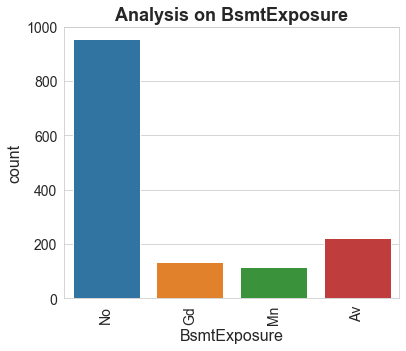

In [44]:
handle_categ("BsmtExposure")

#column not skewed to any particular value

# 38 null values

In [45]:
#imputing null values with value 'no exposure'

house['BsmtExposure'] = house['BsmtExposure'].fillna("No exposure")

- Normalized value counts in BsmtFinType1 column: 
Unf   0.3022
GLQ   0.2937
ALQ   0.1546
BLQ   0.1040
Rec   0.0935
LwQ   0.0520
Name: BsmtFinType1, dtype: float64


- Null values present in BsmtFinType1 column:  37


- Mode value in BsmtFinType1 column:  Unf




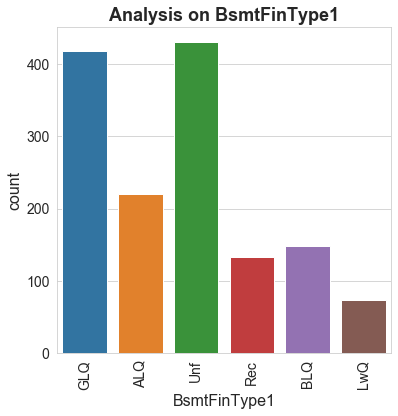

In [46]:
handle_categ("BsmtFinType1")

#column not skewed to any particular value

# 37 null values

In [47]:
#imputing null values with value 'no basement'

house['BsmtFinType1'] = house['BsmtFinType1'].fillna("No basement")

- Normalized value counts in BsmtFinType2 column: 
Unf   0.8833
Rec   0.0380
LwQ   0.0323
BLQ   0.0232
ALQ   0.0134
GLQ   0.0098
Name: BsmtFinType2, dtype: float64


- Null values present in BsmtFinType2 column:  38


- Mode value in BsmtFinType2 column:  Unf




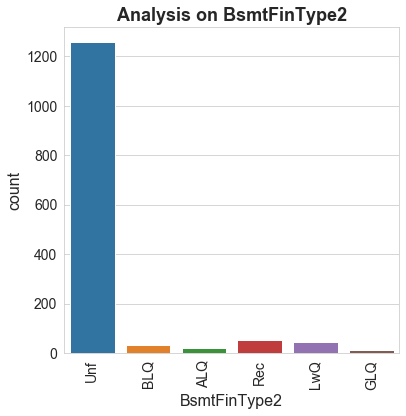

In [48]:
handle_categ("BsmtFinType2")

#column not skewed to any particular value

# 38 null values

In [49]:
#imputing null values with value 'no basement'

house['BsmtFinType2'] = house['BsmtFinType2'].fillna("No basement")

- Normalized value counts in Heating column: 
GasA    0.9781
GasW    0.0123
Grav    0.0048
Wall    0.0027
OthW    0.0014
Floor   0.0007
Name: Heating, dtype: float64


- Null values present in Heating column:  0


- Mode value in Heating column:  GasA




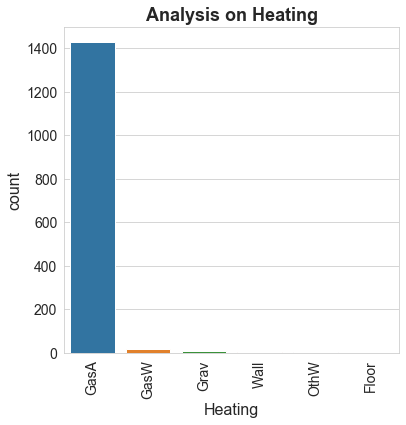

In [50]:
handle_categ("Heating")

#data skewed; adding to skewed_cols

In [51]:
#adding "Heating" column to skewed_cols

skewed_cols.append("Heating")
skewed_cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'BsmtCond',
 'Heating']

- Normalized value counts in HeatingQC column: 
Ex   0.5075
TA   0.2932
Gd   0.1651
Fa   0.0336
Po   0.0007
Name: HeatingQC, dtype: float64


- Null values present in HeatingQC column:  0


- Mode value in HeatingQC column:  Ex




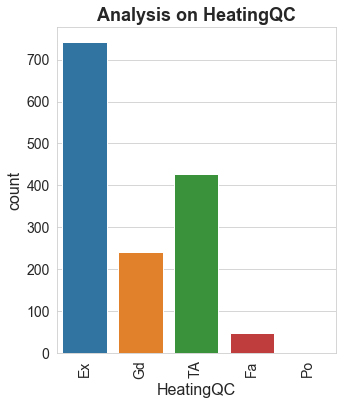

In [52]:
handle_categ("HeatingQC")

#column not skewed to any particular value
#no null values

- Normalized value counts in CentralAir column: 
Y   0.9349
N   0.0651
Name: CentralAir, dtype: float64


- Null values present in CentralAir column:  0


- Mode value in CentralAir column:  Y




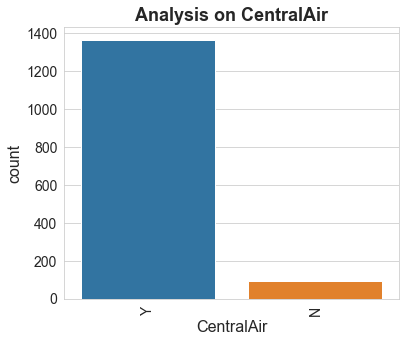

In [53]:
handle_categ("CentralAir")

#data skewed; adding to skewed_cols

In [54]:
#adding "CentralAir" column to skewed_cols

skewed_cols.append("CentralAir")

skewed_cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'BsmtCond',
 'Heating',
 'CentralAir']

- Normalized value counts in Electrical column: 
SBrkr   0.9143
FuseA   0.0644
FuseF   0.0185
FuseP   0.0021
Mix     0.0007
Name: Electrical, dtype: float64


- Null values present in Electrical column:  1


- Mode value in Electrical column:  SBrkr




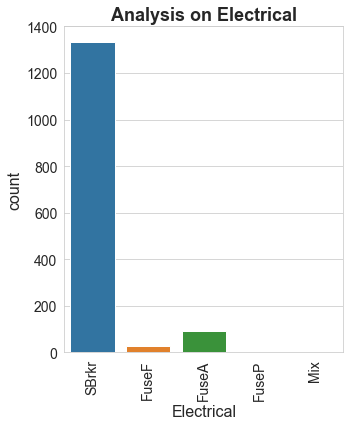

In [55]:
handle_categ("Electrical")

#data skewed; adding to skewed_cols

In [56]:
#adding "Electrical" column to skewed_cols

skewed_cols.append("Electrical")

skewed_cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'BsmtCond',
 'Heating',
 'CentralAir',
 'Electrical']

- Normalized value counts in KitchenQual column: 
TA   0.5034
Gd   0.4014
Ex   0.0685
Fa   0.0267
Name: KitchenQual, dtype: float64


- Null values present in KitchenQual column:  0


- Mode value in KitchenQual column:  TA




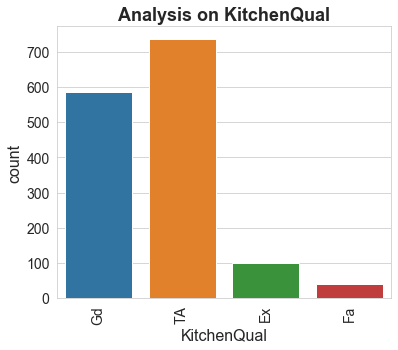

In [57]:
handle_categ("KitchenQual")

#column not skewed to any particular value
#no null values

- Normalized value counts in Functional column: 
Typ    0.9315
Min2   0.0233
Min1   0.0212
Mod    0.0103
Maj1   0.0096
Maj2   0.0034
Sev    0.0007
Name: Functional, dtype: float64


- Null values present in Functional column:  0


- Mode value in Functional column:  Typ




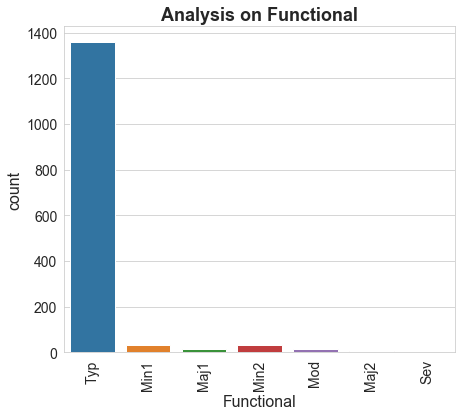

In [58]:
handle_categ("Functional")

#data skewed; adding to skewed_cols

In [59]:
#adding "Functional" column to skewed_cols

skewed_cols.append("Functional")
skewed_cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'BsmtCond',
 'Heating',
 'CentralAir',
 'Electrical',
 'Functional']

- Normalized value counts in GarageType column: 
Attchd    0.6309
Detchd    0.2806
BuiltIn   0.0638
Basment   0.0138
CarPort   0.0065
2Types    0.0044
Name: GarageType, dtype: float64


- Null values present in GarageType column:  81


- Mode value in GarageType column:  Attchd




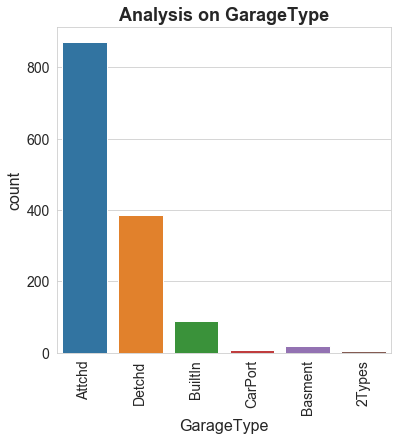

In [60]:
handle_categ("GarageType")

#column not skewed to any particular value

# 81 null values

In [61]:
#imputing missing values

house['GarageType'] = house['GarageType'].fillna("No Garage")

- Normalized value counts in GarageFinish column: 
Unf   0.4387
RFn   0.3060
Fin   0.2553
Name: GarageFinish, dtype: float64


- Null values present in GarageFinish column:  81


- Mode value in GarageFinish column:  Unf




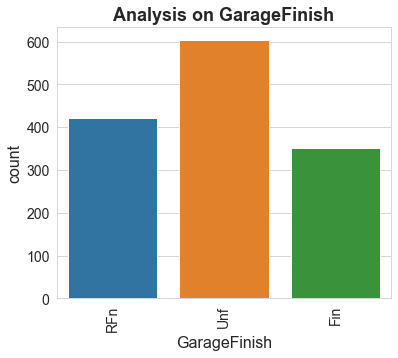

In [62]:
handle_categ("GarageFinish")

#column not skewed to any particular value

# 81 null values

In [63]:
#imputing missing values

house['GarageFinish'] = house['GarageFinish'].fillna("No Garage")

- Normalized value counts in GarageQual column: 
TA   0.9507
Fa   0.0348
Gd   0.0102
Ex   0.0022
Po   0.0022
Name: GarageQual, dtype: float64


- Null values present in GarageQual column:  81


- Mode value in GarageQual column:  TA




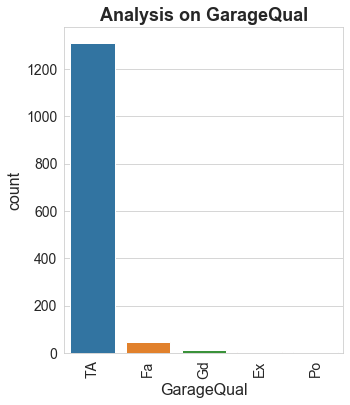

In [64]:
handle_categ("GarageQual")

#data skewed; adding to skewed_cols

In [65]:
#adding "GarageQual" column to skewed_cols

skewed_cols.append("GarageQual")
skewed_cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'BsmtCond',
 'Heating',
 'CentralAir',
 'Electrical',
 'Functional',
 'GarageQual']

- Normalized value counts in GarageCond column: 
TA   0.9616
Fa   0.0254
Gd   0.0065
Po   0.0051
Ex   0.0015
Name: GarageCond, dtype: float64


- Null values present in GarageCond column:  81


- Mode value in GarageCond column:  TA




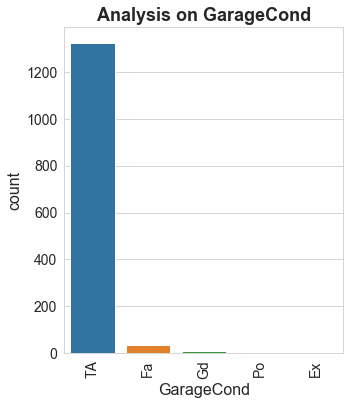

In [66]:
handle_categ("GarageCond")

#data skewed; adding to skewed_cols

In [67]:
#adding "GarageCond" column to skewed_cols

skewed_cols.append("GarageCond")
skewed_cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'BsmtCond',
 'Heating',
 'CentralAir',
 'Electrical',
 'Functional',
 'GarageQual',
 'GarageCond']

- Normalized value counts in PavedDrive column: 
Y   0.9178
N   0.0616
P   0.0205
Name: PavedDrive, dtype: float64


- Null values present in PavedDrive column:  0


- Mode value in PavedDrive column:  Y




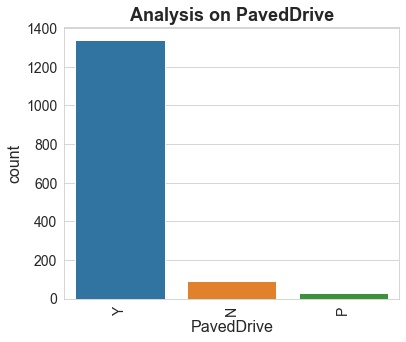

In [68]:
handle_categ("PavedDrive")

#data skewed; adding to skewed_cols

In [69]:
#adding "PavedDrive" column to skewed_cols

skewed_cols.append("PavedDrive")
skewed_cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'BsmtCond',
 'Heating',
 'CentralAir',
 'Electrical',
 'Functional',
 'GarageQual',
 'GarageCond',
 'PavedDrive']

- Normalized value counts in SaleType column: 
WD      0.8678
New     0.0836
COD     0.0295
ConLD   0.0062
ConLw   0.0034
ConLI   0.0034
CWD     0.0027
Oth     0.0021
Con     0.0014
Name: SaleType, dtype: float64


- Null values present in SaleType column:  0


- Mode value in SaleType column:  WD




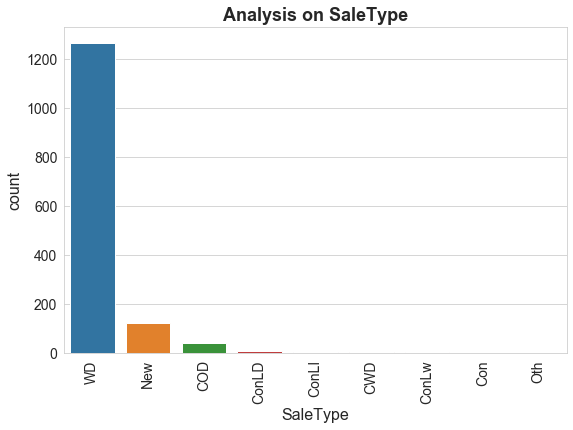

In [70]:
handle_categ("SaleType")

#column not skewed to any particular value
#no null values

- Normalized value counts in SaleCondition column: 
Normal    0.8205
Partial   0.0856
Abnorml   0.0692
Family    0.0137
Alloca    0.0082
AdjLand   0.0027
Name: SaleCondition, dtype: float64


- Null values present in SaleCondition column:  0


- Mode value in SaleCondition column:  Normal




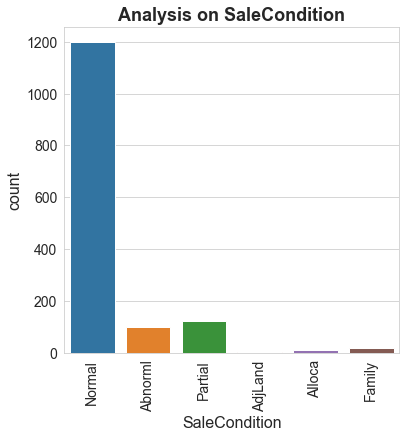

In [71]:
handle_categ("SaleCondition")


#no null values

In [72]:
#dropping all skewed columns from house dataframe

house.drop(labels=skewed_cols, axis = 1, inplace = True)

house.shape

#columns reduced from 76 to 63

(1460, 62)

In [73]:
house.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0000,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0000,Gd,TA,PConc,Gd,No,GLQ,706,Unf,0,150,856,Ex,856,854,0,1710,1,0,2,1,3,1,Gd,8,0,Attchd,2003.0000,RFn,2,548,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0000,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0000,TA,TA,CBlock,Gd,Gd,ALQ,978,Unf,0,284,1262,Ex,1262,0,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,1976.0000,RFn,2,460,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0000,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0000,Gd,TA,PConc,Gd,Mn,GLQ,486,Unf,0,434,920,Ex,920,866,0,1786,1,0,2,1,3,1,Gd,6,1,Attchd,2001.0000,RFn,2,608,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0000,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0000,TA,TA,BrkTil,TA,No,ALQ,216,Unf,0,540,756,Gd,961,756,0,1717,1,0,1,0,3,1,Gd,7,1,Detchd,1998.0000,Unf,3,642,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0000,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0000,Gd,TA,PConc,Gd,Av,GLQ,655,Unf,0,490,1145,Ex,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,1,Attchd,2000.0000,RFn,3,836,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


#### DATA CLEANING & HANDLING of MISSING VALUES IN CONTIONOUS COLUMNS + EDA

In [74]:
#defining a function to check for statistical description, plots and misisng values of all continous columns

def handle_cont(col):
    
    print("\033[1m- Statistical description of "+col+" column: \033[0m")
    print(house[col].describe())
    
    print("\n")
    
    print("\033[1m- Null values present in "+col+" column: \033[0m", house[col].isnull().sum())
    
    print("\n")
    
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
    
    #----------------------------- UNIVARIATE -------------------------------
    
    sns.boxplot(house[col], color='teal',ax=ax[0])
    ax[0].set_title("Distribution of "+col, fontsize=14)
    
    #------------------- BIIVARIATE w.r.t target variable --------------------
    
    sns.scatterplot(x=col, y='SalePrice', data=house, color='crimson')
    ax[1].set_title("Scatter plot: "+col+" vs. SalePrice", fontsize=14)
    
    plt.show()
    

In [75]:
house.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 62 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LandContour    1460 non-null   object 
 6   LotConfig      1460 non-null   object 
 7   Neighborhood   1460 non-null   object 
 8   Condition1     1460 non-null   object 
 9   BldgType       1460 non-null   object 
 10  HouseStyle     1460 non-null   object 
 11  OverallQual    1460 non-null   int64  
 12  OverallCond    1460 non-null   int64  
 13  YearBuilt      1460 non-null   int64  
 14  YearRemodAdd   1460 non-null   int64  
 15  RoofStyle      1460 non-null   object 
 16  Exterior1st    1460 non-null   object 
 17  Exterior2nd    1460 non-null   object 
 18  MasVnrTy

- Statistical description of MSSubClass column: 
count   1460.0000
mean      56.8973
std       42.3006
min       20.0000
25%       20.0000
50%       50.0000
75%       70.0000
max      190.0000
Name: MSSubClass, dtype: float64


- Null values present in MSSubClass column:  0




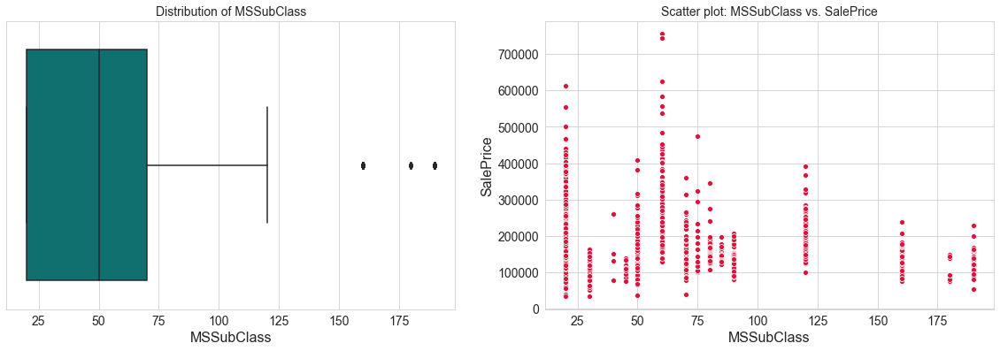

In [76]:
handle_cont("MSSubClass")

# outliers detected --- no null values

In [77]:
#dropping outliers above the 99th percent value

q3 = house['MSSubClass'].quantile(0.99)

house = house[house['MSSubClass'] <= q3]

- Statistical description of LotFrontage column: 
count   1201.0000
mean      70.0500
std       24.2848
min       21.0000
25%       59.0000
50%       69.0000
75%       80.0000
max      313.0000
Name: LotFrontage, dtype: float64


- Null values present in LotFrontage column:  259




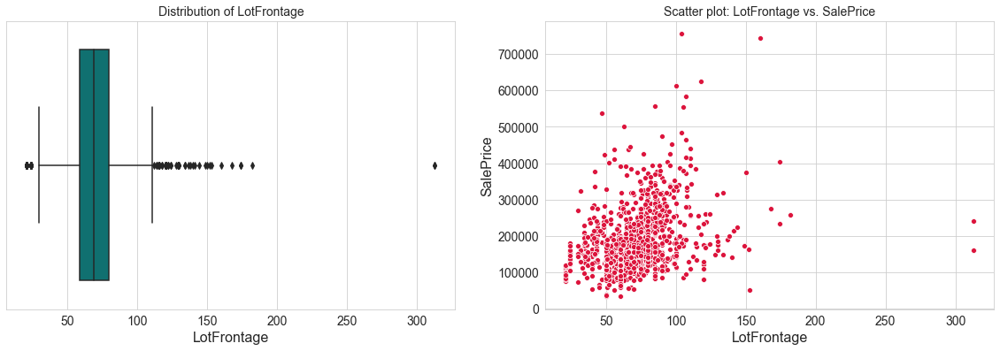

In [78]:
handle_cont("LotFrontage")

# outliers detected --- 259 null values

In [79]:
# since this column depicts feet of street, imputing null values with median

house['LotFrontage'] = house['LotFrontage'].fillna(house['LotFrontage'].median())

In [80]:
#dropping outliers above the 99th percent value

q3 = house['LotFrontage'].quantile(0.99)

house = house[house['LotFrontage'] <= q3]

- Statistical description of LotArea column: 
count     1445.0000
mean     10266.1696
std       8280.5219
min       1300.0000
25%       7500.0000
50%       9439.0000
75%      11478.0000
max     164660.0000
Name: LotArea, dtype: float64


- Null values present in LotArea column:  0




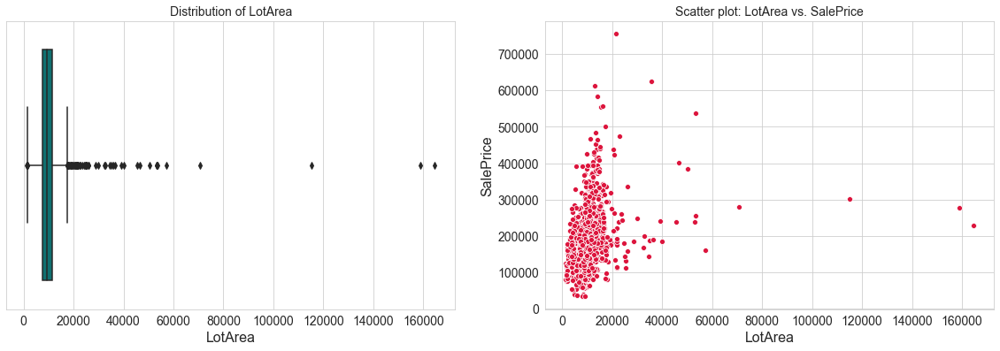

In [81]:
handle_cont("LotArea")

# outliers detected --- no null values

In [82]:
#dropping outliers above the 99th percent value

q3 = house['LotArea'].quantile(0.99)

house = house[house['LotArea'] <= q3]

- Statistical description of OverallQual column: 
count   1430.0000
mean       6.0839
std        1.3689
min        1.0000
25%        5.0000
50%        6.0000
75%        7.0000
max       10.0000
Name: OverallQual, dtype: float64


- Null values present in OverallQual column:  0




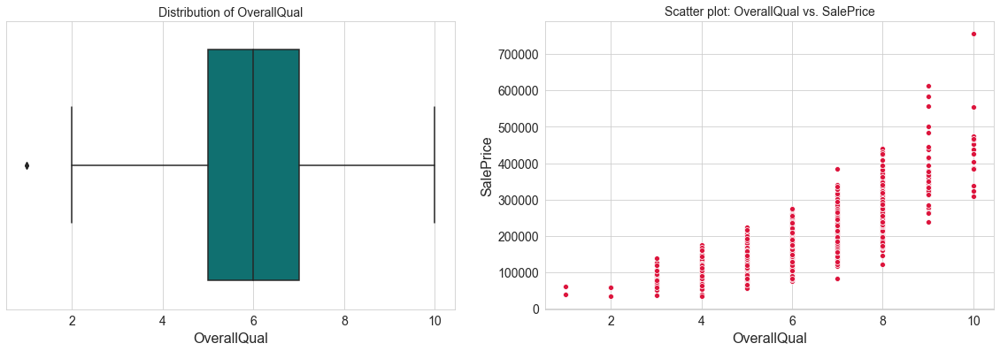

In [83]:
handle_cont("OverallQual")

# 1 outlier detected --- no null values

- Statistical description of OverallCond column: 
count   1430.0000
mean       5.5769
std        1.1158
min        1.0000
25%        5.0000
50%        5.0000
75%        6.0000
max        9.0000
Name: OverallCond, dtype: float64


- Null values present in OverallCond column:  0




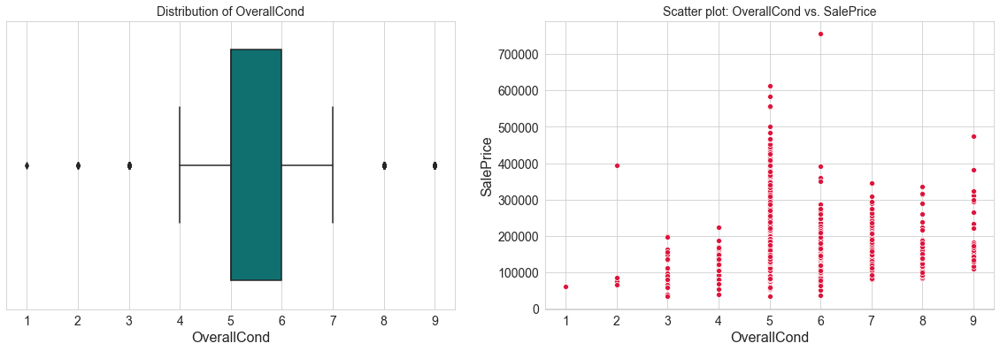

In [84]:
handle_cont("OverallCond")

# outliers detected --- no null values

#since this column depicts the overall rating of the condition of house; not treating the outliers

In [85]:
#dropping outliers above the 99th percent value

q1 = house['OverallCond'].quantile(0.01)

house = house[house['OverallCond'] >= q1]

In [86]:
q3 = house['OverallCond'].quantile(0.99)

house = house[house['OverallCond'] <= q3]

- Statistical description of OverallCond column: 
count   1424.0000
mean       5.5927
std        1.0910
min        3.0000
25%        5.0000
50%        5.0000
75%        6.0000
max        9.0000
Name: OverallCond, dtype: float64


- Null values present in OverallCond column:  0




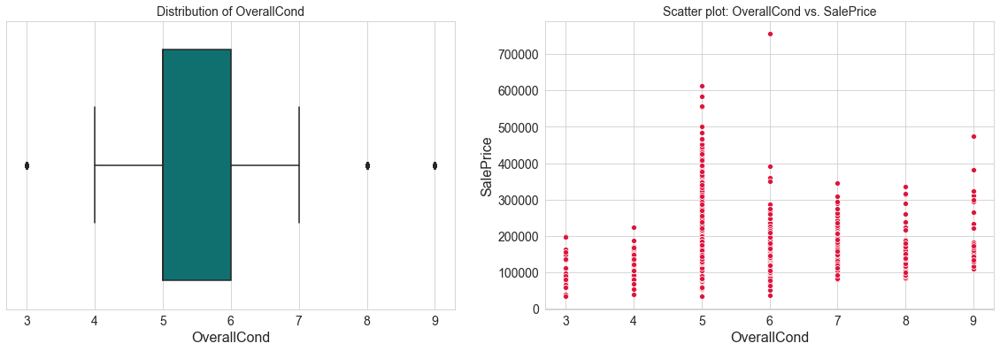

In [87]:
handle_cont("OverallCond")

In [88]:
#changing YearBuilt to Age of house.

from datetime import date

today_date = date.today()

current_yr = today_date.year

current_yr

2021

In [89]:
house['Age_of_house (yrs)'] = current_yr - house["YearBuilt"]

#house.head() #new column added at the end of the dataframe

In [90]:
#dropping all year columns as this is not needed for further analysis.

house.drop(['GarageYrBlt', 'YearBuilt', 'YearRemodAdd', 'YrSold'], axis = 1, inplace = True)

- Statistical description of Age_of_house (yrs) column: 
count   1424.0000
mean      49.5751
std       30.1338
min       12.0000
25%       20.0000
50%       48.0000
75%       67.0000
max      149.0000
Name: Age_of_house (yrs), dtype: float64


- Null values present in Age_of_house (yrs) column:  0




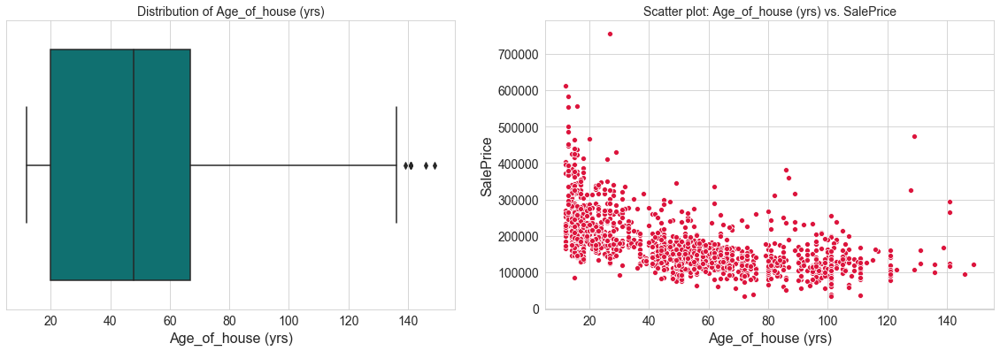

In [91]:
handle_cont("Age_of_house (yrs)")

# outliers detected --- no null values

In [92]:
#dropping outliers above the 99th percent value

q3 = house['Age_of_house (yrs)'].quantile(0.99)

house = house[house['Age_of_house (yrs)'] <= q3]

- Statistical description of MasVnrArea column: 
count   1401.0000
mean     102.8351
std      176.2446
min        0.0000
25%        0.0000
50%        0.0000
75%      167.0000
max     1600.0000
Name: MasVnrArea, dtype: float64


- Null values present in MasVnrArea column:  8




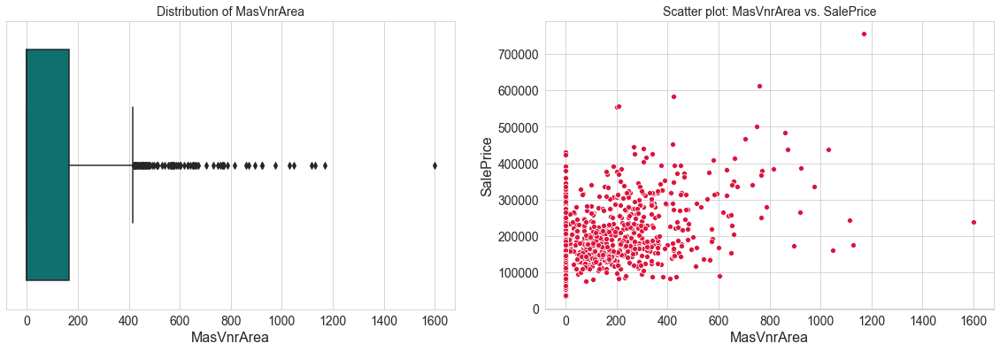

In [93]:
handle_cont("MasVnrArea")

# outliers detected --- 8 null values ---imputing with 0

In [94]:
#imputing missing values with median value,i.e 0 --> this would mean there is no MasVnrArea in those houses.

house['MasVnrArea'] = house['MasVnrArea'].fillna(0)

In [95]:
#dropping outliers above the 99th percent value

q3 = house['MasVnrArea'].quantile(0.99)

house = house[house['MasVnrArea'] <= q3]

- Statistical description of BsmtFinSF1 column: 
count   1394.0000
mean     433.6306
std      422.3328
min        0.0000
25%        0.0000
50%      384.0000
75%      703.5000
max     2188.0000
Name: BsmtFinSF1, dtype: float64


- Null values present in BsmtFinSF1 column:  0




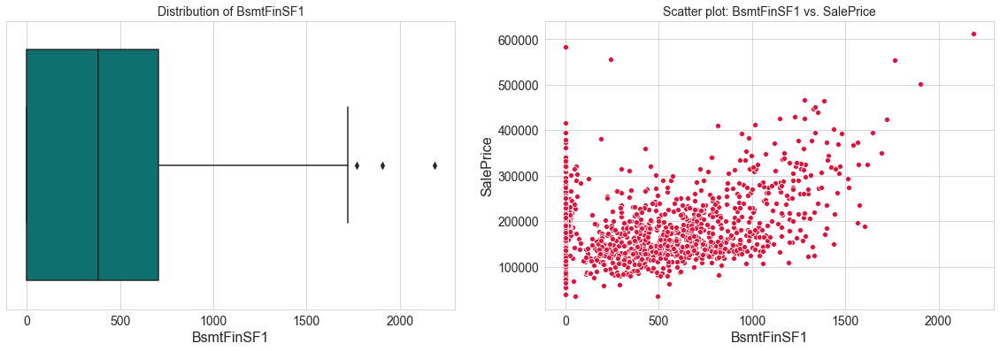

In [96]:
handle_cont("BsmtFinSF1")

# outliers detected --- no null values

In [97]:
#dropping outliers above the 99th percent value

q3 = house['BsmtFinSF1'].quantile(0.99)

house = house[house['BsmtFinSF1'] <= q3]

- Statistical description of BsmtFinSF2 column: 
count   1380.0000
mean      46.4478
std      160.7330
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max     1474.0000
Name: BsmtFinSF2, dtype: float64


- Null values present in BsmtFinSF2 column:  0




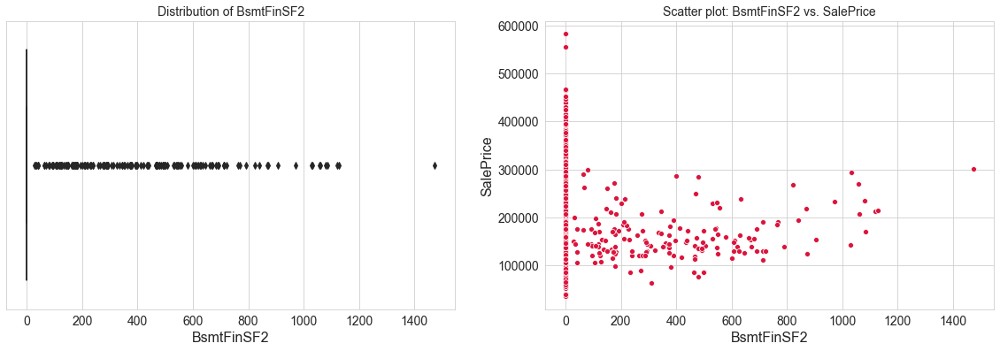

In [98]:
handle_cont("BsmtFinSF2")

# outliers detected --- no null values

In [99]:
#dropping outliers above the 99th percent value

q3 = house['BsmtFinSF2'].quantile(0.99)

house = house[house['BsmtFinSF2'] <= q3]

- Statistical description of BsmtUnfSF column: 
count   1366.0000
mean     569.2474
std      438.9998
min        0.0000
25%      225.5000
50%      484.0000
75%      808.0000
max     2121.0000
Name: BsmtUnfSF, dtype: float64


- Null values present in BsmtUnfSF column:  0




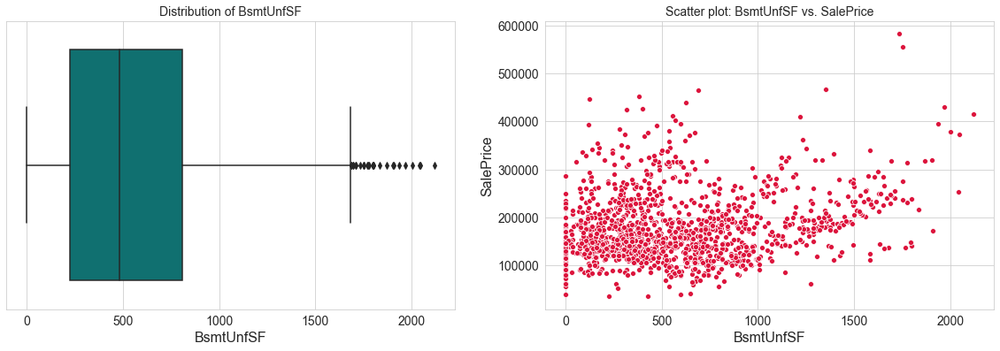

In [100]:
handle_cont("BsmtUnfSF")

# outliers detected --- no null values

In [101]:
#dropping outliers above the 99th percent value

q3 = house['BsmtUnfSF'].quantile(0.99)

house = house[house['BsmtUnfSF'] <= q3]

- Statistical description of TotalBsmtSF column: 
count   1352.0000
mean    1018.2382
std      383.5556
min        0.0000
25%      788.7500
50%      970.0000
75%     1248.0000
max     3206.0000
Name: TotalBsmtSF, dtype: float64


- Null values present in TotalBsmtSF column:  0




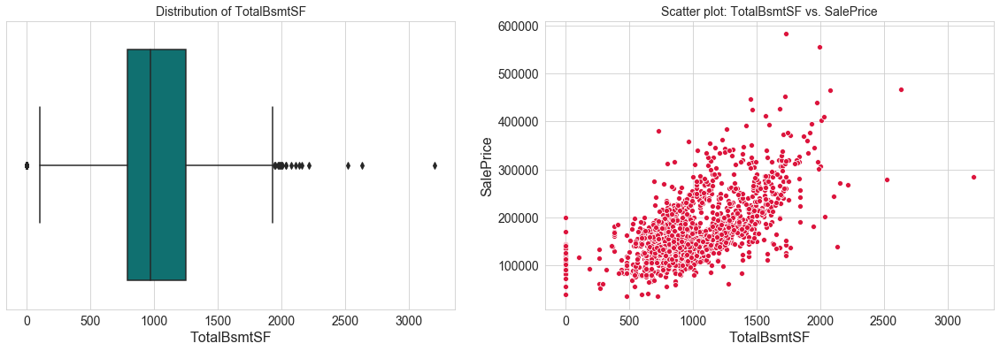

In [102]:
handle_cont("TotalBsmtSF")

# outliers detected --- no null values

In [103]:
#dropping outliers above the 99th percent value

q3 = house['TotalBsmtSF'].quantile(0.99)

house = house[house['TotalBsmtSF'] <= q3]

- Statistical description of 1stFlrSF column: 
count   1338.0000
mean    1115.2825
std      327.8786
min      334.0000
25%      864.0000
50%     1057.0000
75%     1328.0000
max     2898.0000
Name: 1stFlrSF, dtype: float64


- Null values present in 1stFlrSF column:  0




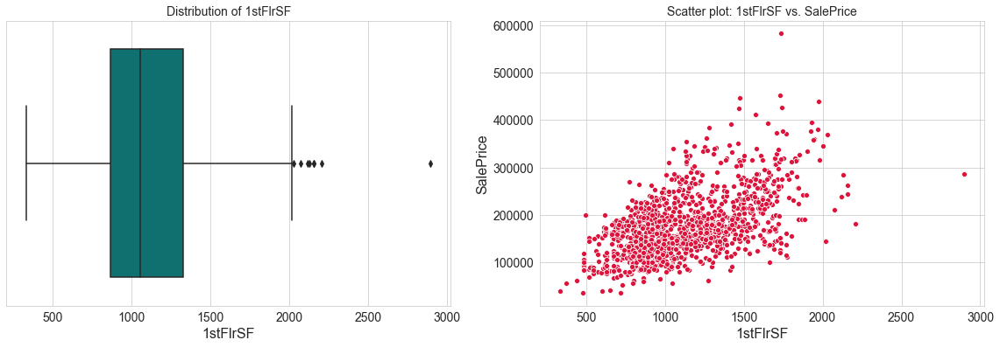

In [104]:
handle_cont("1stFlrSF")

# outliers detected --- no null values

In [105]:
#dropping outliers above the 99th percent value

q3 = house['1stFlrSF'].quantile(0.99)

house = house[house['1stFlrSF'] <= q3]

- Statistical description of 2ndFlrSF column: 
count   1324.0000
mean     343.4343
std      422.0078
min        0.0000
25%        0.0000
50%        0.0000
75%      728.0000
max     1611.0000
Name: 2ndFlrSF, dtype: float64


- Null values present in 2ndFlrSF column:  0




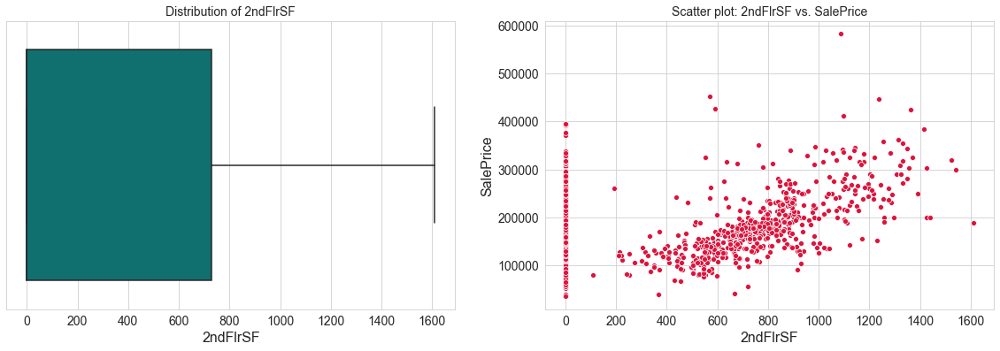

In [106]:
handle_cont("2ndFlrSF")

#no outliers -->no null values

- Statistical description of LowQualFinSF column: 
count   1324.0000
mean       4.7221
std       42.9438
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max      528.0000
Name: LowQualFinSF, dtype: float64


- Null values present in LowQualFinSF column:  0




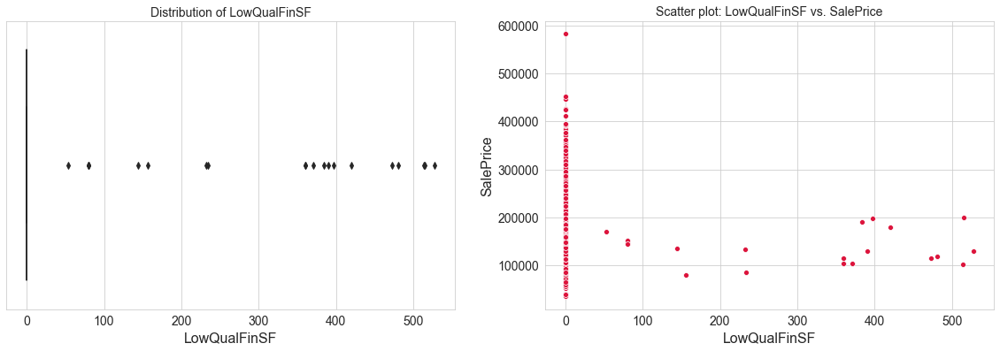

In [107]:
handle_cont("LowQualFinSF")

# outliers detected --- no null values

In [108]:
#house['LowQualFinSF'].value_counts(normalize=True) ---> 0 -  0.9842

#dropping 'LowQualFinSF' column since majority of data lies (98%) in 0. i.e. data is skewed

house.drop('LowQualFinSF', axis = 1, inplace = True)

- Statistical description of GrLivArea column: 
count   1324.0000
mean    1452.8346
std      454.2185
min      334.0000
25%     1111.0000
50%     1416.0000
75%     1713.2500
max     3395.0000
Name: GrLivArea, dtype: float64


- Null values present in GrLivArea column:  0




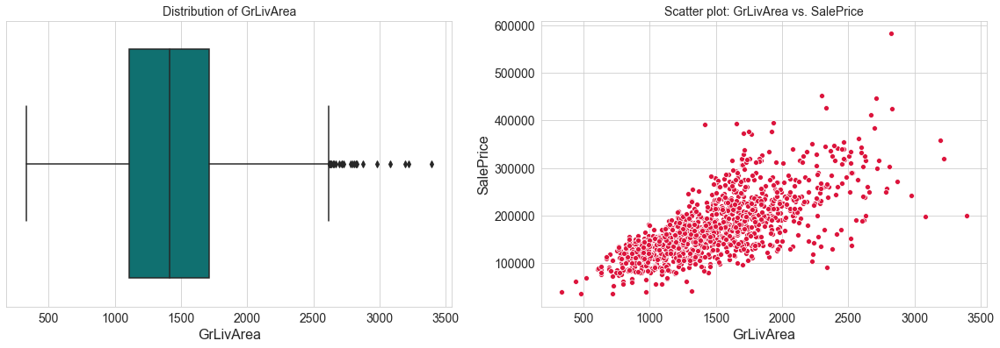

In [109]:
handle_cont("GrLivArea")

# outliers detected --- no null values

In [110]:
#dropping outliers above the 99th percent value

q3 = house['GrLivArea'].quantile(0.99)

house = house[house['GrLivArea'] <= q3]

- Statistical description of BsmtFullBath column: 
count   1310.0000
mean       0.4046
std        0.5078
min        0.0000
25%        0.0000
50%        0.0000
75%        1.0000
max        3.0000
Name: BsmtFullBath, dtype: float64


- Null values present in BsmtFullBath column:  0




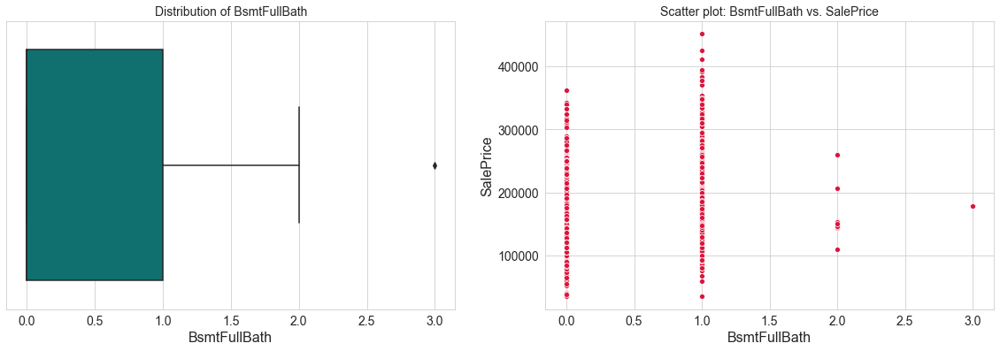

In [111]:
handle_cont("BsmtFullBath")

# outliers detected --- no null values

- Statistical description of BsmtHalfBath column: 
count   1310.0000
mean       0.0588
std        0.2417
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max        2.0000
Name: BsmtHalfBath, dtype: float64


- Null values present in BsmtHalfBath column:  0




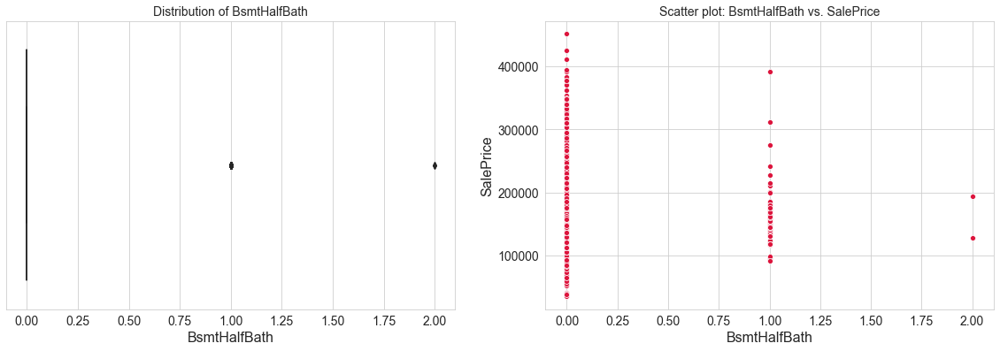

In [112]:
handle_cont("BsmtHalfBath")

# outliers detected --- no null values

- Statistical description of FullBath column: 
count   1310.0000
mean       1.5244
std        0.5278
min        0.0000
25%        1.0000
50%        2.0000
75%        2.0000
max        3.0000
Name: FullBath, dtype: float64


- Null values present in FullBath column:  0




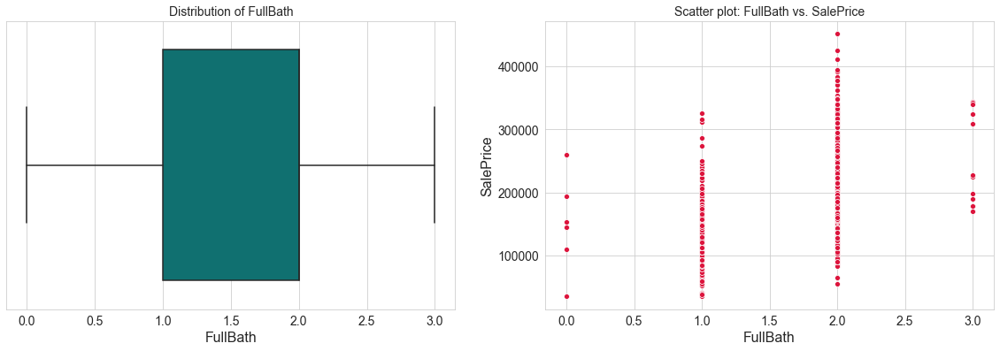

In [113]:
handle_cont("FullBath")

# no outliers detected --- no null values

- Statistical description of HalfBath column: 
count   1310.0000
mean       0.3756
std        0.5030
min        0.0000
25%        0.0000
50%        0.0000
75%        1.0000
max        2.0000
Name: HalfBath, dtype: float64


- Null values present in HalfBath column:  0




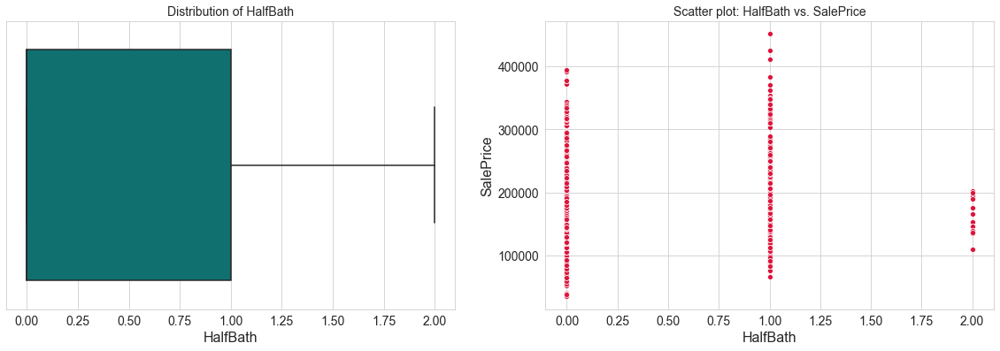

In [114]:
handle_cont("HalfBath")

# no outliers detected --- no null values

- Statistical description of BedroomAbvGr column: 
count   1310.0000
mean       2.8412
std        0.7724
min        0.0000
25%        2.0000
50%        3.0000
75%        3.0000
max        6.0000
Name: BedroomAbvGr, dtype: float64


- Null values present in BedroomAbvGr column:  0




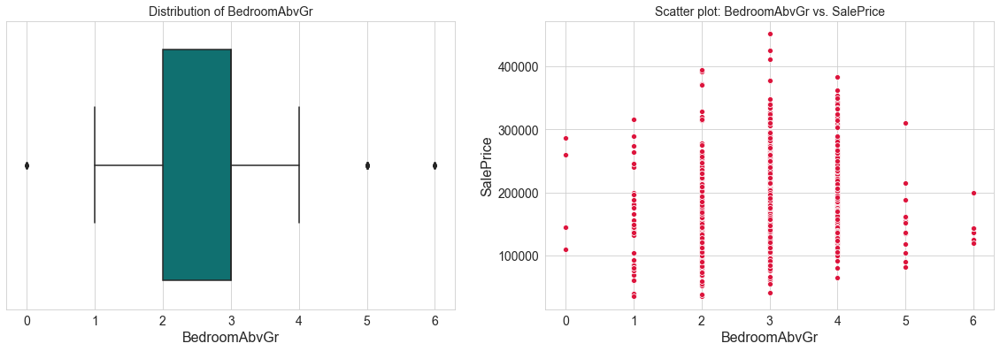

In [115]:
handle_cont("BedroomAbvGr")

# 3 outliers detected --- no null values

- Statistical description of KitchenAbvGr column: 
count   1310.0000
mean       1.0435
std        0.2114
min        0.0000
25%        1.0000
50%        1.0000
75%        1.0000
max        3.0000
Name: KitchenAbvGr, dtype: float64


- Null values present in KitchenAbvGr column:  0




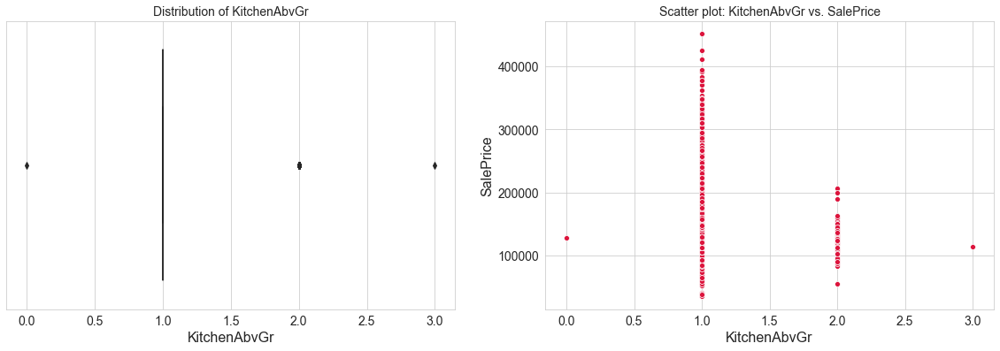

In [116]:
handle_cont("KitchenAbvGr")

# outliers detected --- no null values

- Statistical description of TotRmsAbvGrd column: 
count   1310.0000
mean       6.3405
std        1.4714
min        2.0000
25%        5.0000
50%        6.0000
75%        7.0000
max       12.0000
Name: TotRmsAbvGrd, dtype: float64


- Null values present in TotRmsAbvGrd column:  0




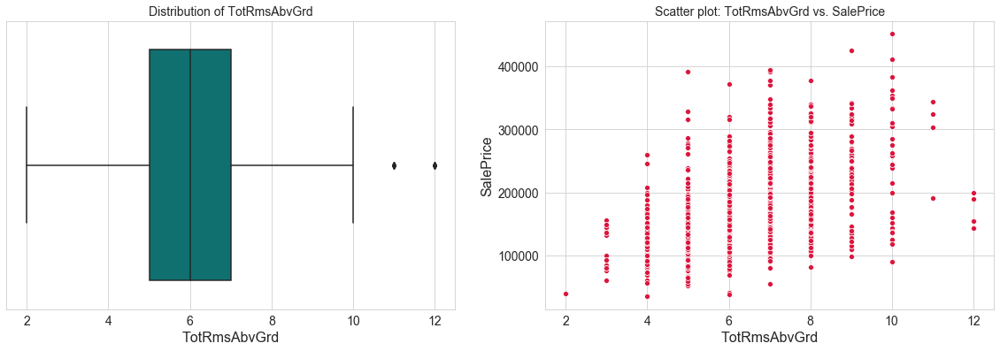

In [117]:
handle_cont("TotRmsAbvGrd")
# outliers detected --- no null values

In [118]:
#dropping outliers above the 99th percent value

q3 = house['TotRmsAbvGrd'].quantile(0.99)

house = house[house['TotRmsAbvGrd'] <= q3]

- Statistical description of Fireplaces column: 
count   1302.0000
mean       0.5576
std        0.6107
min        0.0000
25%        0.0000
50%        0.0000
75%        1.0000
max        3.0000
Name: Fireplaces, dtype: float64


- Null values present in Fireplaces column:  0




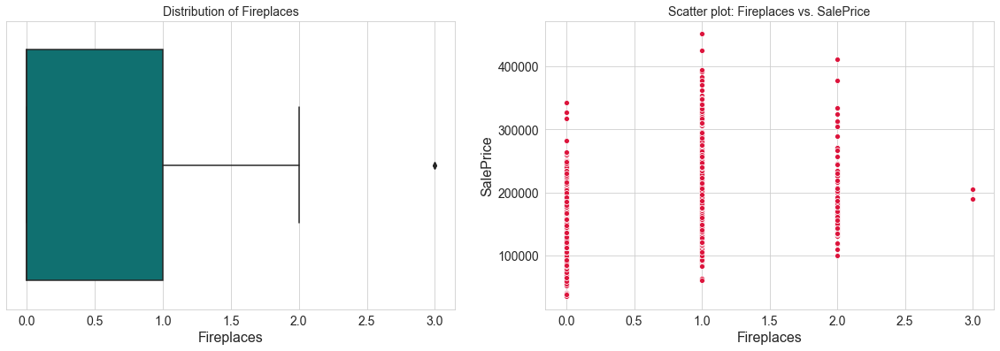

In [119]:
handle_cont("Fireplaces")

# outlier detected --- no null values

- Statistical description of GarageCars column: 
count   1302.0000
mean       1.7120
std        0.7214
min        0.0000
25%        1.0000
50%        2.0000
75%        2.0000
max        4.0000
Name: GarageCars, dtype: float64


- Null values present in GarageCars column:  0




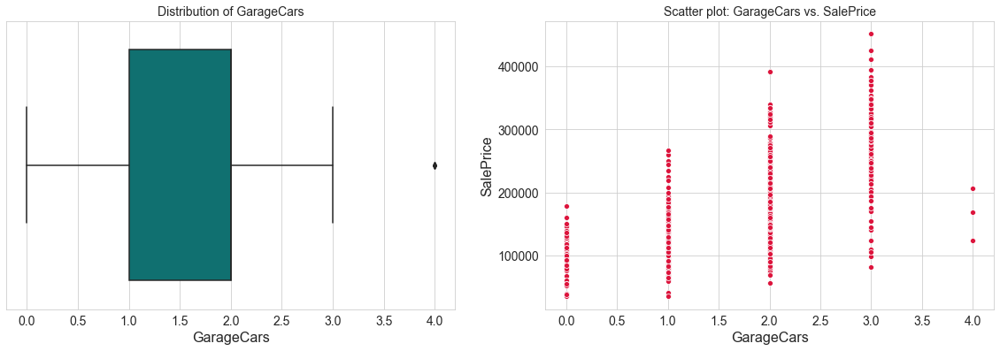

In [120]:
handle_cont("GarageCars")

# outliers detected --- no null values

- Statistical description of GarageArea column: 
count   1302.0000
mean     455.2634
std      200.6932
min        0.0000
25%      308.0000
50%      462.0000
75%      572.0000
max     1356.0000
Name: GarageArea, dtype: float64


- Null values present in GarageArea column:  0




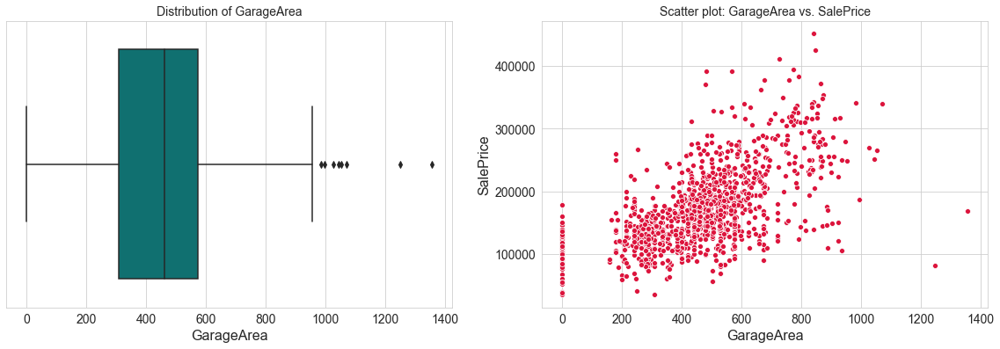

In [121]:
handle_cont("GarageArea")

# outliers detected --- no null values

In [122]:
#dropping outliers above the 99th percent value

q3 = house['GarageArea'].quantile(0.99)

house = house[house['GarageArea'] <= q3]

- Statistical description of WoodDeckSF column: 
count   1289.0000
mean      87.3026
std      118.4428
min        0.0000
25%        0.0000
50%        0.0000
75%      160.0000
max      736.0000
Name: WoodDeckSF, dtype: float64


- Null values present in WoodDeckSF column:  0




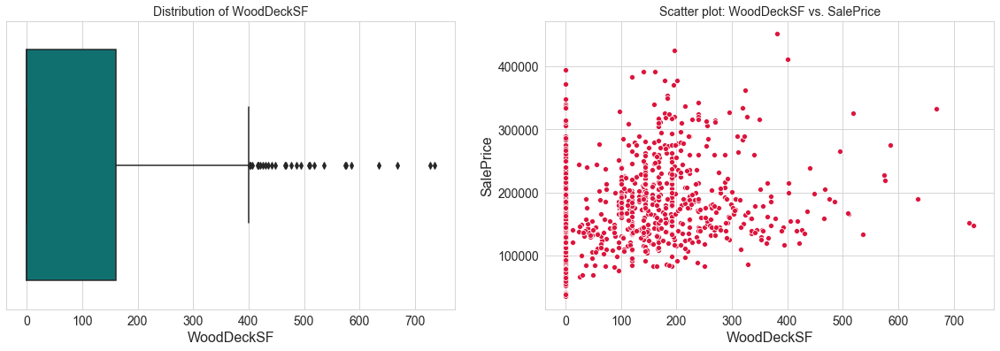

In [123]:
handle_cont("WoodDeckSF")

# outliers detected --- no null values

In [124]:
#dropping outliers above the 99th percent value

q3 = house['WoodDeckSF'].quantile(0.99)

house = house[house['WoodDeckSF'] <= q3]

- Statistical description of OpenPorchSF column: 
count   1276.0000
mean      42.3284
std       59.6750
min        0.0000
25%        0.0000
50%       20.0000
75%       63.0000
max      523.0000
Name: OpenPorchSF, dtype: float64


- Null values present in OpenPorchSF column:  0




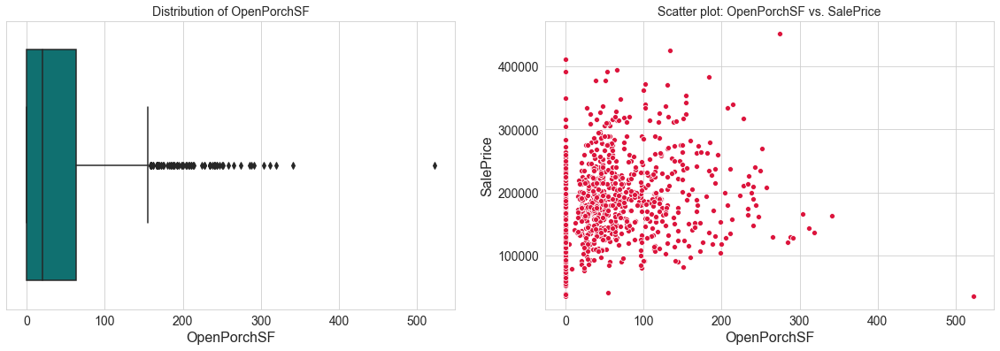

In [125]:
handle_cont("OpenPorchSF")

# outliers detected --- no null values

In [126]:
#dropping outliers above the 99th percent value

q3 = house['OpenPorchSF'].quantile(0.99)

house = house[house['OpenPorchSF'] <= q3]

- Statistical description of EnclosedPorch column: 
count   1263.0000
mean      21.9889
std       59.5162
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max      330.0000
Name: EnclosedPorch, dtype: float64


- Null values present in EnclosedPorch column:  0




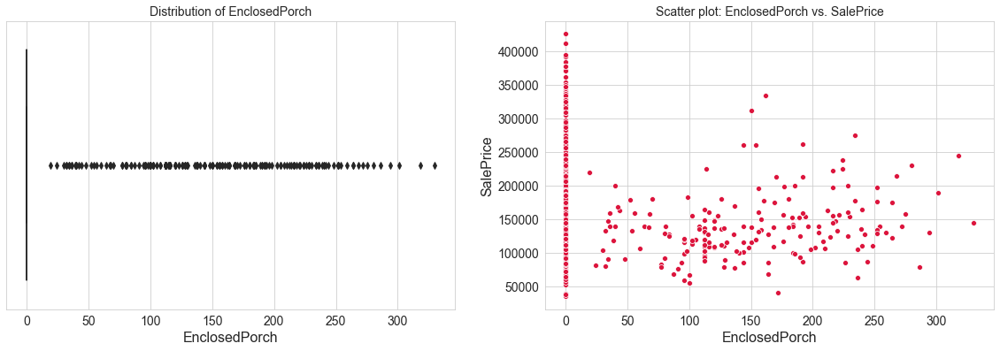

In [127]:
handle_cont("EnclosedPorch")

# outliers detected --- no null values

In [128]:
#dropping outliers above the 99th percent value

q3 = house['EnclosedPorch'].quantile(0.99)

house = house[house['EnclosedPorch'] <= q3]

- Statistical description of 3SsnPorch column: 
count   1250.0000
mean       3.7504
std       30.5973
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max      508.0000
Name: 3SsnPorch, dtype: float64


- Null values present in 3SsnPorch column:  0




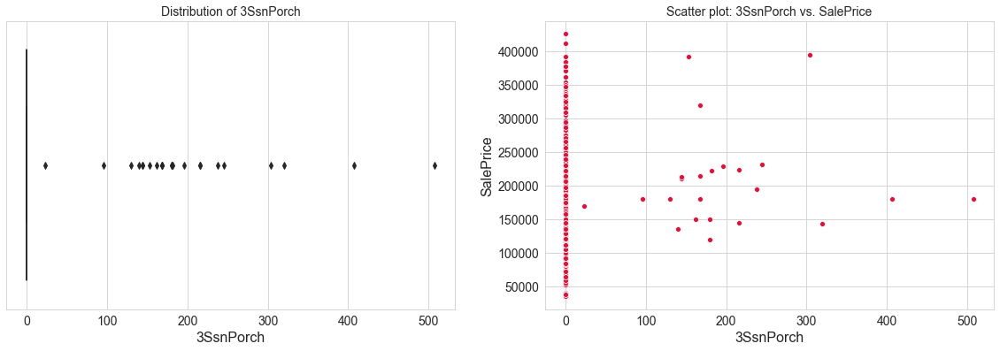

In [129]:
handle_cont("3SsnPorch")

# outliers detected --- no null values

In [130]:
#dropping outliers above the 99th percent value

q3 = house['3SsnPorch'].quantile(0.99)

house = house[house['3SsnPorch'] <= q3]

- Statistical description of ScreenPorch column: 
count   1238.0000
mean      14.0703
std       51.3837
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max      385.0000
Name: ScreenPorch, dtype: float64


- Null values present in ScreenPorch column:  0




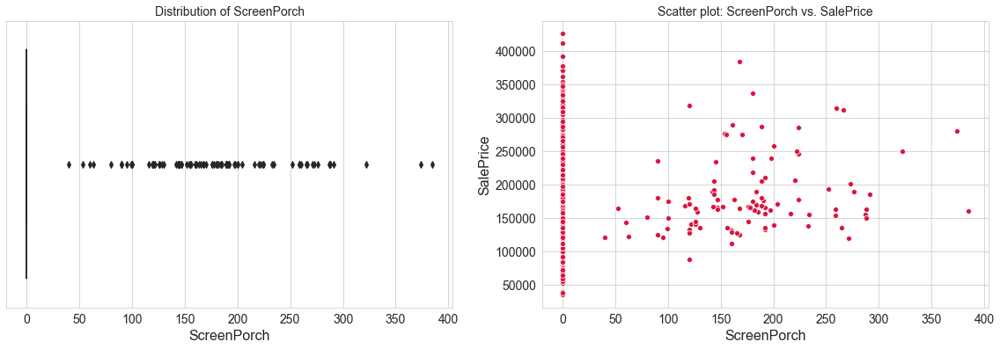

In [131]:
handle_cont("ScreenPorch")

# outliers detected --- no null values

In [132]:
#dropping outliers above the 99th percent value

q3 = house['ScreenPorch'].quantile(0.99)

house = house[house['ScreenPorch'] <= q3]

- Statistical description of PoolArea column: 
count   1225.0000
mean       0.9992
std       24.7612
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max      648.0000
Name: PoolArea, dtype: float64


- Null values present in PoolArea column:  0




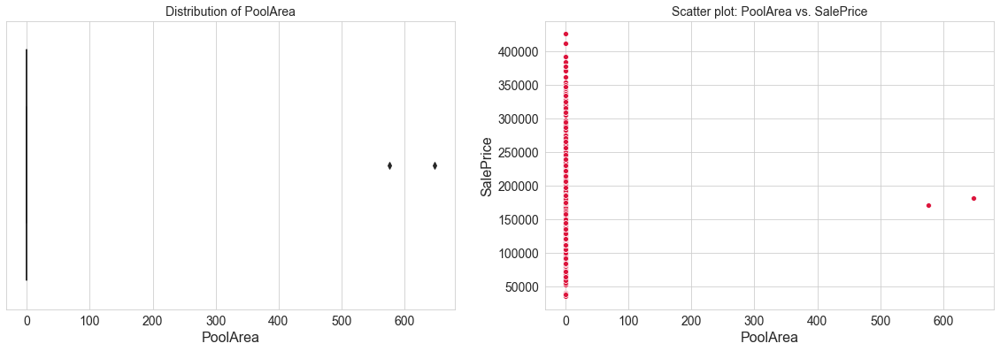

In [133]:
handle_cont("PoolArea")

# outliers detected --- no null values

In [134]:
#data skewed --> house.PoolArea.value_counts(normalize=True) ---> 0     0.9984

#dropping

house.drop('PoolArea', axis = 1, inplace = True)

- Statistical description of MiscVal column: 
count    1225.0000
mean       37.4727
std       479.4767
min         0.0000
25%         0.0000
50%         0.0000
75%         0.0000
max     15500.0000
Name: MiscVal, dtype: float64


- Null values present in MiscVal column:  0




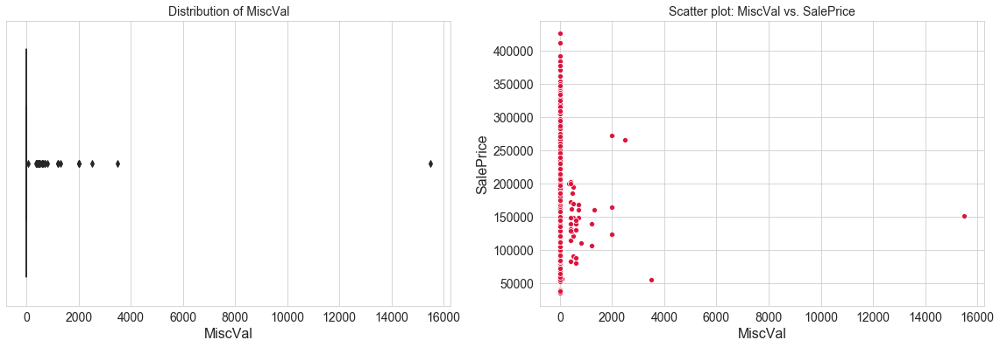

In [135]:
handle_cont("MiscVal")

# outliers detected --- no null values

In [136]:
#data skewed ---> house.MiscVal.value_counts(normalize=True) ---> 0       0.9666

house.drop("MiscVal", axis = 1, inplace = True)

- Statistical description of MoSold column: 
count   1225.0000
mean       6.2914
std        2.6918
min        1.0000
25%        4.0000
50%        6.0000
75%        8.0000
max       12.0000
Name: MoSold, dtype: float64


- Null values present in MoSold column:  0




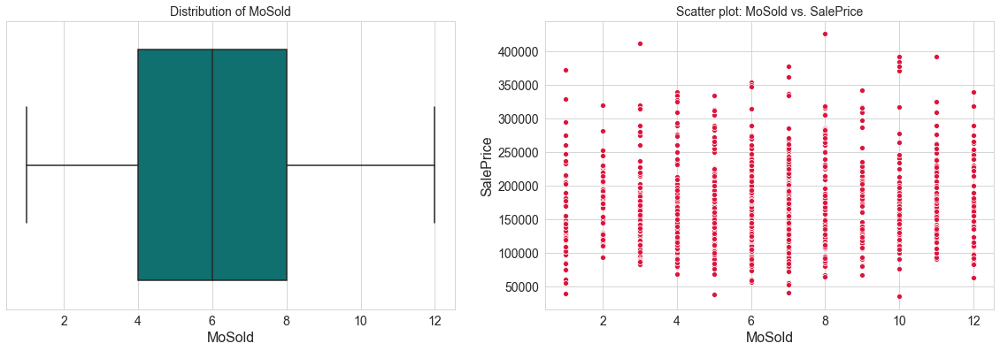

In [137]:
handle_cont("MoSold")

# outliers detected --- no null values

### TARGET VARIABLE

- Statistical description of SalePrice column: 
count     1225.0000
mean    167097.4727
std      59598.7381
min      35311.0000
25%     127500.0000
50%     155000.0000
75%     195400.0000
max     426000.0000
Name: SalePrice, dtype: float64


- Null values present in SalePrice column:  0


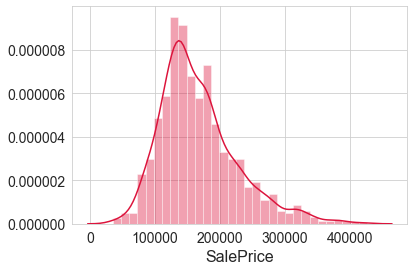

In [138]:
#checking the distribution of target variable

print("\033[1m- Statistical description of SalePrice column: \033[0m")
print(house['SalePrice'].describe())
    
print("\n")
    
print("\033[1m- Null values present in SalePrice column: \033[0m", house['SalePrice'].isnull().sum())

sns.distplot(house['SalePrice'], color = 'crimson')

plt.show()


In [139]:
#presence of outliers found in target variable

#this will be taken care of by log transformation

house['SalePrice'] = np.log(house['SalePrice'])

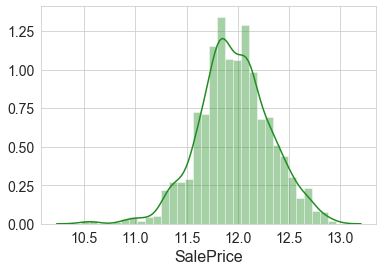

In [140]:
#checking distribution of target variable again

sns.distplot(house['SalePrice'], color = 'forestgreen')

plt.show()

#target variable is less skewed now

In [141]:
#finding percentage of missing values row wise and saving it to 'miss_rows'

miss_rows = 100*(house.isnull().sum(axis=1)/len(house.columns))

miss_rows.describe()

count   1225.0000
mean       0.0000
std        0.0000
min        0.0000
25%        0.0000
50%        0.0000
75%        0.0000
max        0.0000
dtype: float64

- `no row wise missing values`

In [142]:
#CHECKING THE PERCENTAGE OF ROWS RETAINED AFTER DATA CLEANING

bal_rows = round(100*(len(house)/1460),2)

bal_rows

83.9

#### HeatMap

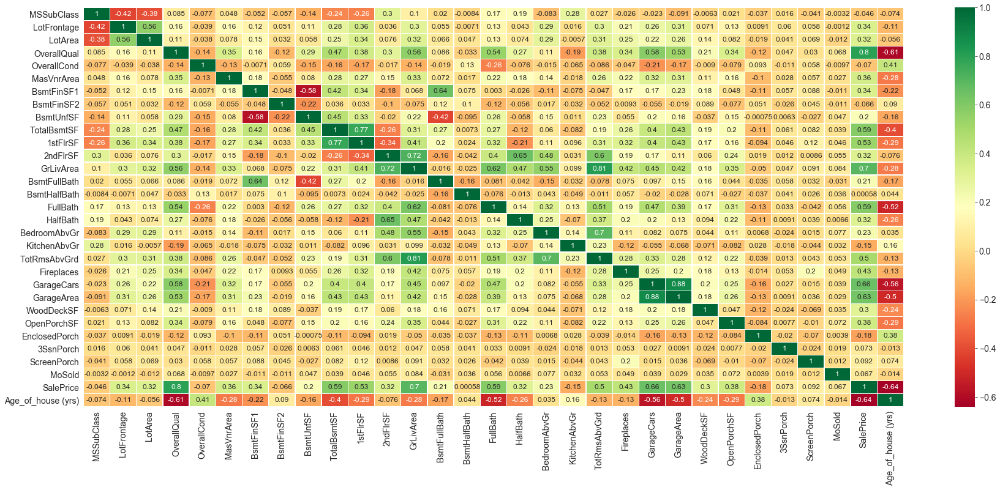

In [143]:
#heatmap of all numerical columns

plt.figure(figsize = (30,12))
sns.heatmap(house.corr(), annot = True, cmap = 'RdYlGn', linewidth=0.5, annot_kws={"size":12})
plt.show()

In [144]:
#top 10 correlated variables

top10 = house.corr().unstack().sort_values(ascending=False).drop_duplicates()[1:11] 

top10

GarageCars    GarageArea     0.8828
GrLivArea     TotRmsAbvGrd   0.8127
OverallQual   SalePrice      0.8006
TotalBsmtSF   1stFlrSF       0.7746
2ndFlrSF      GrLivArea      0.7186
GrLivArea     SalePrice      0.6996
BedroomAbvGr  TotRmsAbvGrd   0.6987
GarageCars    SalePrice      0.6570
HalfBath      2ndFlrSF       0.6519
BsmtFullBath  BsmtFinSF1     0.6442
dtype: float64

In [145]:
#dropping two highly correlated features

house.drop(['GarageCars', 'TotRmsAbvGrd'], axis = 1, inplace = True)

In [146]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1225 entries, 0 to 1457
Data columns (total 54 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   MSSubClass          1225 non-null   int64  
 1   MSZoning            1225 non-null   object 
 2   LotFrontage         1225 non-null   float64
 3   LotArea             1225 non-null   int64  
 4   LotShape            1225 non-null   object 
 5   LandContour         1225 non-null   object 
 6   LotConfig           1225 non-null   object 
 7   Neighborhood        1225 non-null   object 
 8   Condition1          1225 non-null   object 
 9   BldgType            1225 non-null   object 
 10  HouseStyle          1225 non-null   object 
 11  OverallQual         1225 non-null   int64  
 12  OverallCond         1225 non-null   int64  
 13  RoofStyle           1225 non-null   object 
 14  Exterior1st         1225 non-null   object 
 15  Exterior2nd         1225 non-null   object 
 16  MasVnr

In [147]:
#columns of type 'object'

obj_cols = house.select_dtypes(include = 'object').columns

obj_cols

Index(['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood',
       'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'GarageType', 'GarageFinish', 'SaleType',
       'SaleCondition'],
      dtype='object')

In [148]:
#columns of type int / float

num_cols = house.select_dtypes(include = ['int64', 'float64']).columns

num_cols

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'MoSold', 'SalePrice', 'Age_of_house (yrs)'],
      dtype='object')

### DATA PREPERATION & MODEL BUILDING

In [149]:
#importing required libraries

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import scale

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression, Ridge, Lasso

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score


In [150]:
#creating dummy variables for categorical columns using one-hot encoding

obj_dummy = pd.get_dummies(house[obj_cols], drop_first=True)

obj_dummy


,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No Type,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No basement,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No exposure,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No basement,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
6,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,

In [151]:
# Adding the results to the new dataframe

house_df = pd.concat([house, obj_dummy], axis=1)

In [152]:
#dropping all original columns from new dataframe house_df

house_df.drop(labels=obj_cols, axis = 1, inplace = True)

In [153]:
house_df.head()

#now the dataframe consist of all numerical columns (not scaled) and dummy variables of all categorical columns

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MoSold,SalePrice,Age_of_house (yrs),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No Type,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No basement,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No exposure,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No basement,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0000,8450,7,5,196.0000,706,0,150,856,856,854,1710,1,0,2,1,3,1,0,548,0,61,0,0,0,2,12.2477,18,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,80.0000,9600,6,8,0.0000,978,0,284,1262,1262,0,1262,0,1,2,0,3,1,1,460,298,0,0,0,0,5,12.1090,45,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,68.0000,11250,7,5,162.0000,486,0,434,920,920,866,1786,1,0,2,1,3,1,1,608,0,42,0,0,0,9,12.3172,20,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0

In [154]:
#splitting dataset

X = house_df.drop('SalePrice', axis = 1)
y = house_df['SalePrice']

In [155]:
X.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MoSold,Age_of_house (yrs),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No Type,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No basement,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No exposure,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No basement,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0000,8450,7,5,196.0000,706,0,150,856,856,854,1710,1,0,2,1,3,1,0,548,0,61,0,0,0,2,18,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,80.0000,9600,6,8,0.0000,978,0,284,1262,1262,0,1262,0,1,2,0,3,1,1,460,298,0,0,0,0,5,45,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,68.0000,11250,7,5,162.0000,486,0,434,920,920,866,1786,1,0,2,1,3,1,1,608,0,42,0,0,0,9,20,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0

In [156]:
#target variable in y

y.head()

0   12.2477
1   12.1090
2   12.3172
4   12.4292
6   12.6346
Name: SalePrice, dtype: float64

In [157]:
# scaling the features - necessary before using Ridge or Lasso

cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
X.columns


Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       ...
       'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth',
       'SaleType_WD', 'SaleCondition_AdjLand', 'SaleCondition_Alloca',
       'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Partial'],
      dtype='object', length=182)

In [158]:
X.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MoSold,Age_of_house (yrs),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No Type,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No basement,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No exposure,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No basement,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.0539,-0.1315,-0.2112,0.8381,-0.5506,0.8424,0.7462,-0.2890,-0.9501,-0.3815,-0.7639,1.3241,0.7077,1.1637,-0.2409,0.9144,1.2793,0.2345,-0.2026,-0.8974,0.5204,-0.7754,0.3931,-0.3647,-0.0911,-0.2613,-1.5949,-1.0909,-0.2209,-0.0995,0.5267,-0.4285,-0.1473,-0.0702,0.7184,-0.1861,-0.1321,0.3125,-0.2480,-0.1907,-0.0495,0.6009,-0.0404,-0.1150,-0.2127,-0.1113,2.7727,-0.1813,-0.2816,-0.2499,-0.1664,-0.1113,-0.1907,-0.4364,-0.0860,-0.2309,-0.1383,-0.1953,-0.2799,-0.1288,-0.2462,-0.2041,-0.2517,-0.1186,-0.1557,-0.0758,-0.2424,0.3834,-0.0572,-0.0907,-0.0952,-0.1321,-0.0286,-0.0572,-0.1414,-0.1930,-0.1907,-0.2998,-0.1075,-0.9911,-0.0495,-0.0495,1.5290,-0.1765,-0.2249,0.4601,-0.0952,-0.4338,-0.0495,-0.0286,-0.0286,-0.0404,-0.1690,-0.0286,-0.1953,-0.4483,-0.0286,-0.4338,-0.2643,-0.1288,1.3310,-0.3890,-0.1352,-0.0495,-0.0758,-0.1113,-0.0286,-0.1930,-0.4258,-0.0640,-0.4271,-0.0286,-0.3078,-0.0495,-0.1321,1.3549,-0.3904,-0.1611,1.5410,-0.0702,-1.2480,-0.2949,-0.0860,1.4388,-1.36

In [159]:
# Splitting the data into train and test

np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=42)

In [160]:
#first model // creating an instance of Linear regression

lm = LinearRegression()
lm.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [161]:
# Print the coefficients and intercept
print(lm.intercept_)
print(lm.coef_)

11.965453303856322
[-1.52258721e-02  3.25563690e-03  1.86390029e-02  5.74505064e-02
  4.99684281e-02 -1.38328292e-03 -1.64953529e+11 -5.15042385e+10
 -1.73565107e+11  1.48599597e+11  4.42504883e-02  6.92958832e-02
  4.35018539e-02  1.04265213e-02  1.56688690e-03  1.51100159e-02
  1.04451180e-02  5.29479980e-03 -2.73895264e-03  1.18551254e-02
  2.93400288e-02  1.41553879e-02  5.82504272e-03  4.80461121e-03
  3.92627716e-03  1.16834641e-02  7.62939453e-04 -7.50160217e-02
  8.13560486e-02  4.15687561e-02  1.67251587e-01  1.37523651e-01
  3.98254395e-03 -2.85530090e-03  5.96046448e-03  1.49536133e-03
 -6.35242462e-03 -3.11660767e-03  5.56182861e-03 -6.92367554e-03
 -2.53200531e-04 -4.47845459e-03 -3.19957733e-03 -6.25228882e-03
  4.30297852e-03 -4.95147705e-03 -1.02119446e-02  2.38676071e-02
 -2.24609375e-02 -7.54928589e-03 -3.30352783e-03 -1.60446167e-02
 -1.23882294e-02 -1.31511688e-02 -2.01034546e-03 -1.11179352e-02
  4.50134277e-04  6.54983521e-03 -1.20697021e-02 -2.50530243e-03
 -7.37

In [162]:
#scores of linear model

y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.9236567117080886
0.9441748185671596
7.391907291556608
3.047501277326657
0.00862532939504855
0.008281253470996352


In [163]:
#FEATURE SELECTION USING RFE

rfe = RFE(lm, 50) #selecting 50 features

rfe = rfe.fit(X_train, y_train)

In [164]:
list(zip(X_train.columns, rfe.support_,rfe.ranking_))

[('MSSubClass', True, 1),
 ('LotFrontage', False, 132),
 ('LotArea', True, 1),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('MasVnrArea', False, 103),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', True, 1),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', True, 1),
 ('1stFlrSF', True, 1),
 ('2ndFlrSF', True, 1),
 ('GrLivArea', False, 91),
 ('BsmtFullBath', False, 90),
 ('BsmtHalfBath', False, 110),
 ('FullBath', False, 6),
 ('HalfBath', True, 1),
 ('BedroomAbvGr', False, 74),
 ('KitchenAbvGr', False, 15),
 ('Fireplaces', True, 1),
 ('GarageArea', True, 1),
 ('WoodDeckSF', True, 1),
 ('OpenPorchSF', False, 81),
 ('EnclosedPorch', False, 57),
 ('3SsnPorch', False, 76),
 ('ScreenPorch', False, 20),
 ('MoSold', False, 68),
 ('Age_of_house (yrs)', True, 1),
 ('MSZoning_FV', True, 1),
 ('MSZoning_RH', True, 1),
 ('MSZoning_RL', True, 1),
 ('MSZoning_RM', True, 1),
 ('LotShape_IR2', False, 86),
 ('LotShape_IR3', False, 133),
 ('LotShape_Reg', False, 123),
 ('LandContour_HLS', False, 100),
 ('

In [165]:
cols_rfe = X_train.columns[rfe.support_]

cols_rfe

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'HalfBath', 'Fireplaces', 'GarageArea', 'WoodDeckSF',
       'Age_of_house (yrs)', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL',
       'MSZoning_RM', 'Neighborhood_Crawfor', 'Neighborhood_Somerst',
       'Condition1_Norm', 'BldgType_2fmCon', 'BldgType_TwnhsE',
       'HouseStyle_SFoyer', 'HouseStyle_SLvl', 'Exterior1st_BrkComm',
       'Exterior1st_MetalSd', 'MasVnrType_BrkFace', 'MasVnrType_None',
       'MasVnrType_Stone', 'Foundation_PConc', 'BsmtQual_No basement',
       'BsmtExposure_Gd', 'BsmtFinType1_GLQ', 'BsmtFinType2_No basement',
       'HeatingQC_TA', 'KitchenQual_Fa', 'KitchenQual_Gd', 'KitchenQual_TA',
       'GarageType_Attchd', 'GarageType_Basment', 'GarageType_BuiltIn',
       'GarageType_CarPort', 'GarageType_Detchd', 'GarageType_No Garage',
       'GarageFinish_No Garage', 'SaleType_New', 'SaleCondition_Normal',


In [166]:
X_train.columns[~rfe.support_]

Index(['LotFrontage', 'MasVnrArea', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'OpenPorchSF', 'EnclosedPorch',
       ...
       'SaleType_CWD', 'SaleType_Con', 'SaleType_ConLD', 'SaleType_ConLI',
       'SaleType_ConLw', 'SaleType_Oth', 'SaleType_WD',
       'SaleCondition_AdjLand', 'SaleCondition_Alloca',
       'SaleCondition_Family'],
      dtype='object', length=132)

In [167]:
X_train_rfe = X_train[cols_rfe]

In [168]:
X_train_rfe.shape

(857, 50)

In [169]:
X_test_rfe = X_test[cols_rfe]

In [170]:
X_test_rfe.shape

(368, 50)

### `RIDGE`

In [171]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 

params = {'alpha': [0.0001, 0.0005, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
                    4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation

folds = 5

ridge_model = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1) 

ridge_model.fit(X_train_rfe, y_train) 

Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 145 out of 145 | elapsed:    1.1s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.0005, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   50, 100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [172]:
# Printing the best hyperparameter alpha

print(ridge_model.best_params_)

{'alpha': 10.0}


In [173]:
#Fitting Ridge model for alpha = 10 and printing coefficients which have been penalised

alpha = 10
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_rfe, y_train)
print(ridge.coef_)

[-0.0407525   0.01563194  0.07849174  0.04708842  0.03462145  0.00848805
  0.00435582  0.04646123  0.07481433  0.11549486  0.0147175   0.01354512
  0.02988277  0.01133833 -0.05955899  0.04103174  0.01777991  0.08868536
  0.06186929  0.02651227  0.01712301  0.02083081  0.01365317  0.01868871
  0.00854587  0.01112054 -0.02370165  0.0100531   0.01025635  0.01208778
  0.01148522  0.02346484  0.00496505  0.01136476  0.01163531  0.00496505
 -0.01576648 -0.01553719 -0.03150865 -0.03328934  0.02007487 -0.0018802
  0.0127614   0.00199407  0.01370116  0.00083315  0.00083315  0.04022413
  0.02118336 -0.01239209]


In [174]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = ridge.predict(X_train_rfe)
y_pred_test = ridge.predict(X_test_rfe)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9086731012851322
0.913733318709474
8.842689169274458
4.7093052754317375
0.010318190395886181
0.012797025204977547


In [175]:
ridge_model.cv_results_

{'mean_fit_time': array([0.00399756, 0.00499754, 0.00499668, 0.00699644, 0.0069972 ,
        0.00639482, 0.00299854, 0.00459685, 0.00419788, 0.00319824,
        0.00339808, 0.00319829, 0.00299854, 0.00419793, 0.00339808,
        0.00379763, 0.00319796, 0.00439758, 0.00439758, 0.00379772,
        0.00419779, 0.00439672, 0.00399823, 0.00379872, 0.00339847,
        0.00339866, 0.00399804, 0.00359845, 0.00459757]),
 'std_fit_time': array([0.00089362, 0.00063211, 0.0010948 , 0.00178859, 0.0022778 ,
        0.00224315, 0.00109571, 0.00048961, 0.000748  , 0.00074856,
        0.00048908, 0.00116513, 0.00063218, 0.00074811, 0.00101945,
        0.00097935, 0.00039992, 0.00079956, 0.00079956, 0.00116564,
        0.00040009, 0.00048975, 0.00089346, 0.00074935, 0.00080035,
        0.00049017, 0.00089367, 0.00079924, 0.00048971]),
 'mean_score_time': array([0.00199852, 0.00199795, 0.00259805, 0.0027987 , 0.00239687,
        0.00199881, 0.00180006, 0.0017983 , 0.00139875, 0.00119991,
        0.001399

In [176]:
ridge_df = pd.DataFrame(ridge_model.cv_results_)

In [177]:
ridge_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.0040,0.0009,0.0020,0.0009,0.0001,{'alpha': 0.0001},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,25,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
1,0.0050,0.0006,0.0020,0.0000,0.0005,{'alpha': 0.0005},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,24,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
2,0.0050,0.0011,0.0026,0.0008,0.0010,{'alpha': 0.001},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,23,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
3,0.0070,0.0018,0.0028,0.0007,0.0100,{'alpha': 0.01},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,22,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
4,0.0070,0.0023,0.0024,0.0005,0.0500,{'alpha': 0.05},-0.0860,-0.0740,-0.0778,-0.0769,-0.0776,-0.0785,0.0040,21,-0.0686,-0.0715,-0.0709,-0.0716,-0.0722,-0.0709,0.0012


In [178]:
ridge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29 entries, 0 to 28
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   mean_fit_time       29 non-null     float64
 1   std_fit_time        29 non-null     float64
 2   mean_score_time     29 non-null     float64
 3   std_score_time      29 non-null     float64
 4   param_alpha         29 non-null     object 
 5   params              29 non-null     object 
 6   split0_test_score   29 non-null     float64
 7   split1_test_score   29 non-null     float64
 8   split2_test_score   29 non-null     float64
 9   split3_test_score   29 non-null     float64
 10  split4_test_score   29 non-null     float64
 11  mean_test_score     29 non-null     float64
 12  std_test_score      29 non-null     float64
 13  rank_test_score     29 non-null     int32  
 14  split0_train_score  29 non-null     float64
 15  split1_train_score  29 non-null     float64
 16  split2_tra

In [179]:
#convertinf 'param_alpha' to float

ridge_df['param_alpha'] = ridge_df['param_alpha'].astype('float64')

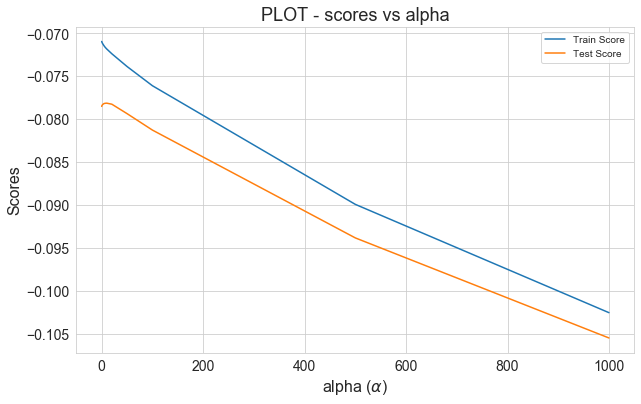

In [180]:
#plotting mean test and train scores with different alpha

plt.figure(figsize=(10,6))
plt.plot('param_alpha','mean_train_score', data = ridge_df)
plt.plot('param_alpha', 'mean_test_score', data = ridge_df)
plt.xlabel("alpha ($\\alpha$)")
plt.ylabel("Scores")

plt.title("PLOT - scores vs alpha")
plt.legend(['Train Score', 'Test Score'])
plt.show()

### LASSO

In [181]:
lasso = Lasso()

# cross validation
lasso_model = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model.fit(X_train_rfe, y_train) 

Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 145 out of 145 | elapsed:    1.3s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.0005, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   50, 100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [182]:
# Printing the best hyperparameter alpha

print(lasso_model.best_params_)

{'alpha': 0.001}


In [183]:
#Fitting lasso model for alpha = 100 and printing coefficients which have been penalised

alpha = 0.001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_rfe, y_train) 

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [184]:
lasso.coef_

array([-3.33967949e-02,  1.55218295e-02,  8.26642227e-02,  4.72096077e-02,
        3.13191243e-02,  5.88457969e-03, -0.00000000e+00,  4.39387225e-02,
        7.97301176e-02,  1.14872186e-01,  1.11930397e-02,  1.30072157e-02,
        2.97141358e-02,  1.10567897e-02, -6.11267447e-02,  3.07064247e-02,
        1.20495622e-02,  7.01939285e-02,  4.31034013e-02,  2.52247884e-02,
        1.65545954e-02,  1.99759833e-02,  9.04807790e-03,  1.41725043e-02,
        5.83063655e-03,  7.82519428e-03, -2.26280437e-02,  8.52592169e-03,
       -0.00000000e+00,  0.00000000e+00,  4.22523976e-03,  2.23793653e-02,
        3.66296808e-03,  1.07109084e-02,  1.06746106e-02,  1.51809952e-03,
       -1.55951213e-02, -1.10871679e-02, -1.99991326e-02, -2.08144528e-02,
        3.51325082e-03, -4.80452909e-03,  4.63003596e-03, -0.00000000e+00,
       -0.00000000e+00, -4.49734985e-03, -2.65978245e-16,  2.80562178e-02,
        2.08726980e-02,  0.00000000e+00])

In [185]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_rfe)
y_pred_test = lasso.predict(X_test_rfe)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9066658581758607
0.9150103600701109
9.037039652562761
4.63959148180221
0.010544970423060398
0.01260758554837557


In [186]:
lasso_model.cv_results_

{'mean_fit_time': array([0.04617214, 0.01339073, 0.00839367, 0.00499635, 0.0035984 ,
        0.0035984 , 0.00379868, 0.00379786, 0.00299907, 0.00319815,
        0.00459809, 0.00379825, 0.00419803, 0.00259895, 0.00339837,
        0.00479727, 0.00339899, 0.00479798, 0.00359836, 0.00419793,
        0.00399809, 0.00419793, 0.00299873, 0.00399818, 0.00339837,
        0.00339832, 0.00439792, 0.00299935, 0.00419745]),
 'std_fit_time': array([0.01255347, 0.00402775, 0.00162378, 0.00126403, 0.00119927,
        0.00079951, 0.00097893, 0.0011653 , 0.00063226, 0.00116548,
        0.00079951, 0.00074814, 0.00074796, 0.00048994, 0.00101929,
        0.00039961, 0.00048951, 0.00040021, 0.00048951, 0.001166  ,
        0.00126425, 0.00074786, 0.00063241, 0.00126429, 0.00101892,
        0.0010195 , 0.00079945, 0.00063226, 0.00097877]),
 'mean_score_time': array([0.0021996 , 0.00219984, 0.00120044, 0.00159903, 0.0013989 ,
        0.00139861, 0.00139842, 0.00159893, 0.0013989 , 0.00139947,
        0.001798

In [187]:
lasso_df = pd.DataFrame(lasso_model.cv_results_)

In [188]:
lasso_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.0462,0.0126,0.0022,0.0004,0.0001,{'alpha': 0.0001},-0.0862,-0.0742,-0.0774,-0.0768,-0.0775,-0.0784,0.0041,3,-0.0688,-0.0717,-0.0711,-0.0717,-0.0722,-0.0711,0.0012
1,0.0134,0.0040,0.0022,0.0004,0.0005,{'alpha': 0.0005},-0.0875,-0.0750,-0.0755,-0.0768,-0.0773,-0.0784,0.0046,2,-0.0692,-0.0722,-0.0719,-0.0722,-0.0725,-0.0716,0.0012
2,0.0084,0.0016,0.0012,0.0004,0.0010,{'alpha': 0.001},-0.0883,-0.0758,-0.0732,-0.0766,-0.0780,-0.0784,0.0052,1,-0.0698,-0.0728,-0.0735,-0.0727,-0.0730,-0.0723,0.0013
3,0.0050,0.0013,0.0016,0.0005,0.0100,{'alpha': 0.01},-0.0929,-0.0842,-0.0784,-0.0817,-0.0859,-0.0846,0.0049,4,-0.0777,-0.0799,-0.0818,-0.0800,-0.0793,-0.0798,0.0013
4,0.0036,0.0012,0.0014,0.0005,0.0500,{'alpha': 0.05},-0.1317,-0.1231,-0.1245,-0.1218,-0.1336,-0.1269,0.0048,5,-0.1224,-0.1245,-0.1286,-0.1253,-0.1216,-0.1245,0.0025


In [189]:
lasso_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29 entries, 0 to 28
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   mean_fit_time       29 non-null     float64
 1   std_fit_time        29 non-null     float64
 2   mean_score_time     29 non-null     float64
 3   std_score_time      29 non-null     float64
 4   param_alpha         29 non-null     object 
 5   params              29 non-null     object 
 6   split0_test_score   29 non-null     float64
 7   split1_test_score   29 non-null     float64
 8   split2_test_score   29 non-null     float64
 9   split3_test_score   29 non-null     float64
 10  split4_test_score   29 non-null     float64
 11  mean_test_score     29 non-null     float64
 12  std_test_score      29 non-null     float64
 13  rank_test_score     29 non-null     int32  
 14  split0_train_score  29 non-null     float64
 15  split1_train_score  29 non-null     float64
 16  split2_tra

In [190]:
#convertinf 'param_alpha' to float

lasso_df['param_alpha'] = lasso_df['param_alpha'].astype('float64')

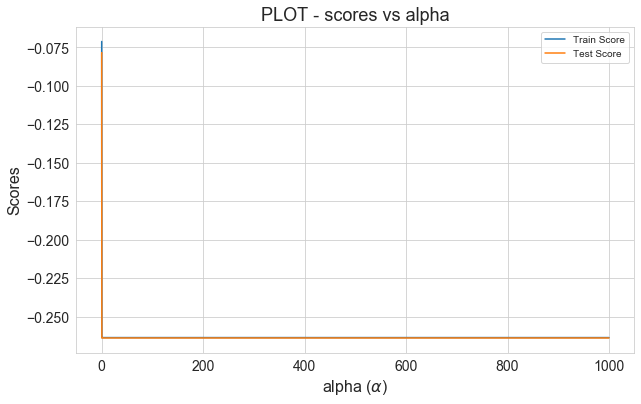

In [191]:
#plotting mean test and train scores with different alpha

plt.figure(figsize=(10,6))
plt.plot('param_alpha','mean_train_score', data = lasso_df)
plt.plot('param_alpha', 'mean_test_score', data = lasso_df)
plt.xlabel("alpha ($\\alpha$)")
plt.ylabel("Scores")

plt.title("PLOT - scores vs alpha")
plt.legend(['Train Score', 'Test Score'])
plt.show()

In [192]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.9237,0.9087,0.9067
1,R2 Score (Test),0.9442,0.9137,0.9150
2,RSS (Train),7.3919,8.8427,9.0370
3,RSS (Test),3.0475,4.7093,4.6396
4,MSE (Train),0.0929,0.1016,0.1027
5,MSE (Test),0.0910,0.1131,0.1123


#### Finding betas

In [193]:
#creating betas df 

betas = pd.DataFrame(index=X_train_rfe.columns)

In [194]:
betas.head()

""
MSSubClass
LotArea
OverallQual
OverallCond
BsmtFinSF1


In [195]:
betas.rows = X_train_rfe.columns

In [196]:
#adding ridge and lasso coefficents

betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

In [197]:
pd.set_option('display.max_rows', None)
betas.sort_values('Lasso', ascending=False)

,Ridge,Lasso
2ndFlrSF,0.1155,0.1149
OverallQual,0.0785,0.0827
1stFlrSF,0.0748,0.0797
MSZoning_RL,0.0887,0.0702
OverallCond,0.0471,0.0472
TotalBsmtSF,0.0465,0.0439
MSZoning_RM,0.0619,0.0431
BsmtFinSF1,0.0346,0.0313
MSZoning_FV,0.0410,0.0307
GarageArea,0.0299,0.0297


### Considering the absolute values of coefficients,

##### Top 10 features from Ridge

- 2ndFlrSF --->	        0.1090	
- OverallQual --->	        0.0792	
- 1stFlrSF --->	        0.0720	
- MSZoning_RL --->	        0.0641	
- Age_of_house (yrs) --->	0.0563	
- TotalBsmtSF --->        0.0463	
- OverallCond --->	        0.0461	
- MSZoning_RM --->	        0.0395	
- MSSubClass --->	        0.0352	
- BsmtFinSF1 --->	        0.0341


##### Top 10 features from Lasso

- 2ndFlrSF --->		      0.1065
- OverallQual --->		      0.0875
- 1stFlrSF --->		      0.0815
- Age_of_house (yrs) --->	  0.0604
- OverallCond --->		      0.0464
- TotalBsmtSF --->		      0.0382
- BsmtFinSF1 --->		      0.0314
- GarageArea --->		      0.0305
- SaleType_New --->		  0.0273
- Neighborhood_Crawfor --->  0.0238

### SUBJECTIVE QUESTIONS CODE

In [198]:
#change in model if alpha values of ridge and lasso are doubled

#initial value of alpha for ridge: 10


alpha = 20
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_rfe, y_train)
print(ridge.coef_)

[-0.03520347  0.0165019   0.07921733  0.04613174  0.03410633  0.00855276
  0.00471364  0.04632978  0.07195466  0.10895989  0.01592112  0.01435252
  0.03053718  0.01167985 -0.05628846  0.02823311  0.01234919  0.06412947
  0.03952261  0.02609283  0.01711698  0.02057339  0.0107325   0.01542142
  0.00721397  0.00956979 -0.02335545  0.00955449  0.00793089  0.00897541
  0.01006528  0.02414343  0.00502119  0.01117914  0.01263475  0.00502119
 -0.01611429 -0.01475989 -0.02719807 -0.02983462  0.01247414 -0.00422042
  0.01013379 -0.00077981  0.00542798 -0.00111706 -0.00111706  0.03246892
  0.0212983  -0.00435339]


In [199]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = ridge.predict(X_train_rfe)
y_pred_test = ridge.predict(X_test_rfe)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9069585855665753
0.9127345288677285
9.008696444112168
4.76382929560285
0.010511897834436602
0.012945188303268615


In [200]:
ridge_model.cv_results_

{'mean_fit_time': array([0.00399756, 0.00499754, 0.00499668, 0.00699644, 0.0069972 ,
        0.00639482, 0.00299854, 0.00459685, 0.00419788, 0.00319824,
        0.00339808, 0.00319829, 0.00299854, 0.00419793, 0.00339808,
        0.00379763, 0.00319796, 0.00439758, 0.00439758, 0.00379772,
        0.00419779, 0.00439672, 0.00399823, 0.00379872, 0.00339847,
        0.00339866, 0.00399804, 0.00359845, 0.00459757]),
 'std_fit_time': array([0.00089362, 0.00063211, 0.0010948 , 0.00178859, 0.0022778 ,
        0.00224315, 0.00109571, 0.00048961, 0.000748  , 0.00074856,
        0.00048908, 0.00116513, 0.00063218, 0.00074811, 0.00101945,
        0.00097935, 0.00039992, 0.00079956, 0.00079956, 0.00116564,
        0.00040009, 0.00048975, 0.00089346, 0.00074935, 0.00080035,
        0.00049017, 0.00089367, 0.00079924, 0.00048971]),
 'mean_score_time': array([0.00199852, 0.00199795, 0.00259805, 0.0027987 , 0.00239687,
        0.00199881, 0.00180006, 0.0017983 , 0.00139875, 0.00119991,
        0.001399

In [201]:
ridge_df = pd.DataFrame(ridge_model.cv_results_)

In [202]:
ridge_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.0040,0.0009,0.0020,0.0009,0.0001,{'alpha': 0.0001},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,25,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
1,0.0050,0.0006,0.0020,0.0000,0.0005,{'alpha': 0.0005},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,24,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
2,0.0050,0.0011,0.0026,0.0008,0.0010,{'alpha': 0.001},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,23,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
3,0.0070,0.0018,0.0028,0.0007,0.0100,{'alpha': 0.01},-0.0860,-0.0740,-0.0779,-0.0769,-0.0776,-0.0785,0.0040,22,-0.0686,-0.0715,-0.0708,-0.0716,-0.0722,-0.0709,0.0012
4,0.0070,0.0023,0.0024,0.0005,0.0500,{'alpha': 0.05},-0.0860,-0.0740,-0.0778,-0.0769,-0.0776,-0.0785,0.0040,21,-0.0686,-0.0715,-0.0709,-0.0716,-0.0722,-0.0709,0.0012


In [203]:
#convertinf 'param_alpha' to float

ridge_df['param_alpha'] = ridge_df['param_alpha'].astype('float64')

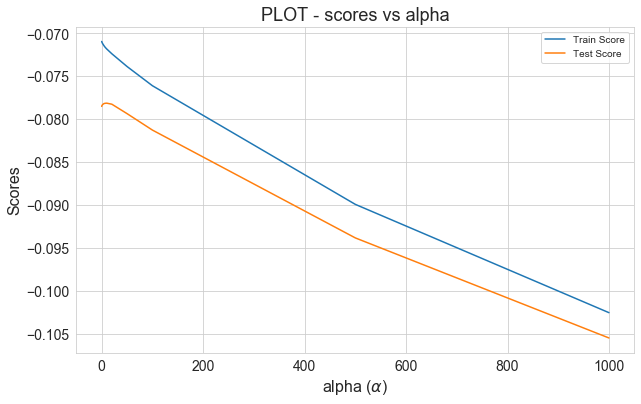

In [204]:
#plotting mean test and train scores with different alpha

plt.figure(figsize=(10,6))
plt.plot('param_alpha','mean_train_score', data = ridge_df)
plt.plot('param_alpha', 'mean_test_score', data = ridge_df)
plt.xlabel("alpha ($\\alpha$)")
plt.ylabel("Scores")

plt.title("PLOT - scores vs alpha")
plt.legend(['Train Score', 'Test Score'])
plt.show()

In [205]:

#initial value of alpha for LASSO: 0.001

alpha = 0.002

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_rfe, y_train) 

Lasso(alpha=0.002, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [206]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_rfe)
y_pred_test = lasso.predict(X_test_rfe)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9010802953316017
0.9126389344888332
9.577859463179959
4.769047800662963
0.011176032045717571
0.01295936902354066


In [207]:
lasso.coef_

array([-1.96888835e-02,  1.68205134e-02,  8.75475700e-02,  4.64151300e-02,
        3.13893434e-02,  4.89390830e-03, -0.00000000e+00,  3.82297881e-02,
        8.15310208e-02,  1.06521942e-01,  9.28438191e-03,  1.37629335e-02,
        3.05065437e-02,  1.07879964e-02, -6.03972579e-02,  4.40103013e-03,
        6.12113710e-04,  2.31757417e-02,  0.00000000e+00,  2.37717519e-02,
        1.72799556e-02,  1.91279836e-02,  1.03320722e-03,  5.45319397e-03,
        1.29456602e-03,  2.65014293e-03, -2.13384080e-02,  6.50196917e-03,
       -0.00000000e+00,  0.00000000e+00,  2.94656680e-03,  2.15502818e-02,
        0.00000000e+00,  1.00200379e-02,  1.10583694e-02,  6.23447577e-04,
       -1.58523532e-02, -5.83665696e-03, -3.85691315e-03, -4.74145109e-03,
        3.56248361e-03, -4.86129652e-03,  5.25580511e-03, -8.94382814e-04,
       -0.00000000e+00, -3.45654240e-03, -2.27748956e-17,  2.72951343e-02,
        1.96253072e-02,  0.00000000e+00])

In [208]:
lasso_df = pd.DataFrame(lasso_model.cv_results_)

In [209]:
lasso_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.0462,0.0126,0.0022,0.0004,0.0001,{'alpha': 0.0001},-0.0862,-0.0742,-0.0774,-0.0768,-0.0775,-0.0784,0.0041,3,-0.0688,-0.0717,-0.0711,-0.0717,-0.0722,-0.0711,0.0012
1,0.0134,0.0040,0.0022,0.0004,0.0005,{'alpha': 0.0005},-0.0875,-0.0750,-0.0755,-0.0768,-0.0773,-0.0784,0.0046,2,-0.0692,-0.0722,-0.0719,-0.0722,-0.0725,-0.0716,0.0012
2,0.0084,0.0016,0.0012,0.0004,0.0010,{'alpha': 0.001},-0.0883,-0.0758,-0.0732,-0.0766,-0.0780,-0.0784,0.0052,1,-0.0698,-0.0728,-0.0735,-0.0727,-0.0730,-0.0723,0.0013
3,0.0050,0.0013,0.0016,0.0005,0.0100,{'alpha': 0.01},-0.0929,-0.0842,-0.0784,-0.0817,-0.0859,-0.0846,0.0049,4,-0.0777,-0.0799,-0.0818,-0.0800,-0.0793,-0.0798,0.0013
4,0.0036,0.0012,0.0014,0.0005,0.0500,{'alpha': 0.05},-0.1317,-0.1231,-0.1245,-0.1218,-0.1336,-0.1269,0.0048,5,-0.1224,-0.1245,-0.1286,-0.1253,-0.1216,-0.1245,0.0025


In [210]:
#convertinf 'param_alpha' to float

lasso_df['param_alpha'] = lasso_df['param_alpha'].astype('float64')

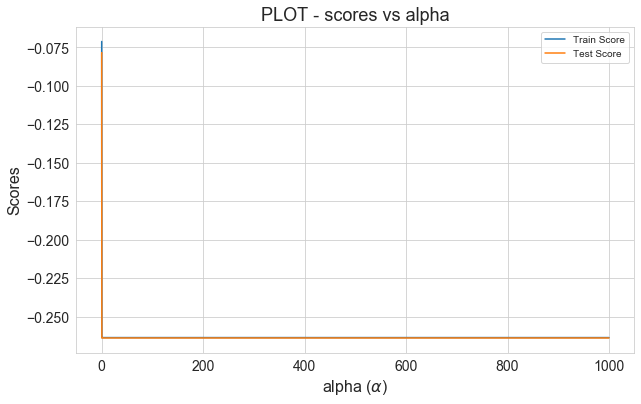

In [211]:
#plotting mean test and train scores with different alpha

plt.figure(figsize=(10,6))
plt.plot('param_alpha','mean_train_score', data = lasso_df)
plt.plot('param_alpha', 'mean_test_score', data = lasso_df)
plt.xlabel("alpha ($\\alpha$)")
plt.ylabel("Scores")

plt.title("PLOT - scores vs alpha")
plt.legend(['Train Score', 'Test Score'])
plt.show()

In [212]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.9237,0.9070,0.9011
1,R2 Score (Test),0.9442,0.9127,0.9126
2,RSS (Train),7.3919,9.0087,9.5779
3,RSS (Test),3.0475,4.7638,4.7690
4,MSE (Train),0.0929,0.1025,0.1057
5,MSE (Test),0.0910,0.1138,0.1138


In [213]:
#finding betas again

#creating betas df 

betas2 = pd.DataFrame(index=X_train_rfe.columns)

In [214]:
betas2.rows = X_train_rfe.columns

In [215]:
#adding ridge and lasso coefficents

betas2['Ridge'] = ridge.coef_
betas2['Lasso'] = lasso.coef_

In [216]:
pd.set_option('display.max_rows', None)
betas2.sort_values('Ridge', ascending=False)

,Ridge,Lasso
2ndFlrSF,0.1090,0.1065
OverallQual,0.0792,0.0875
1stFlrSF,0.0720,0.0815
MSZoning_RL,0.0641,0.0232
TotalBsmtSF,0.0463,0.0382
OverallCond,0.0461,0.0464
MSZoning_RM,0.0395,0.0000
BsmtFinSF1,0.0341,0.0314
SaleType_New,0.0325,0.0273
GarageArea,0.0305,0.0305


### top from ridge

- 2ndFlrSF ----->	0.1090	
- OverallQual ----->	0.0792	
- 1stFlrSF ----->	0.0720	
- MSZoning_RL ----->	0.0641	
- Age_of_house (yrs) ----->	0.0563	
- TotalBsmtSF ----->	0.0463	
- OverallCond ----->	0.0461	
- MSZoning_RM ----->	0.0395	
- MSSubClass ----->	0.0352	
- BsmtFinSF1 ----->	0.0341


### top from lasso

- 2ndFlrSF ----->	0.1065
- OverallQual ----->	0.0875
- 1stFlrSF	 ----->	0.0815
- Age_of_house (yrs) ----->	0.0604
- OverallCond ----->	0.0464
- TotalBsmtSF ----->	0.0382
- BsmtFinSF1 ----->		0.0314
- GarageArea ----->		0.0305
- SaleType_New	 ----->	0.0273
- Neighborhood_Crawfor	 ----->	0.0238

### What if the top five variables are removed in lasso?

In [217]:
#dropping top 5 features to remodel lasso

X_train_rfe.drop(['2ndFlrSF','OverallQual' ,'1stFlrSF','Age_of_house (yrs)','OverallCond'], axis = 1, inplace= True)
X_test_rfe.drop(['2ndFlrSF','OverallQual' ,'1stFlrSF','Age_of_house (yrs)','OverallCond'], axis = 1, inplace= True)

In [218]:
#initial value of alpha for LASSO: 0.001

alpha = 0.001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_rfe, y_train) 

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [219]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_rfe)
y_pred_test = lasso.predict(X_test_rfe)

metric4 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric4.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric4.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric4.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric4.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric4.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric4.append(mse_test_lr**0.5)

0.8214581978950352
0.8179262939305222
17.28723609311934
9.939418691936698
0.020171804075985227
0.027009289923741027


In [220]:
lasso_df = pd.DataFrame(lasso_model.cv_results_)

In [221]:
lasso_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.0462,0.0126,0.0022,0.0004,0.0001,{'alpha': 0.0001},-0.0862,-0.0742,-0.0774,-0.0768,-0.0775,-0.0784,0.0041,3,-0.0688,-0.0717,-0.0711,-0.0717,-0.0722,-0.0711,0.0012
1,0.0134,0.0040,0.0022,0.0004,0.0005,{'alpha': 0.0005},-0.0875,-0.0750,-0.0755,-0.0768,-0.0773,-0.0784,0.0046,2,-0.0692,-0.0722,-0.0719,-0.0722,-0.0725,-0.0716,0.0012
2,0.0084,0.0016,0.0012,0.0004,0.0010,{'alpha': 0.001},-0.0883,-0.0758,-0.0732,-0.0766,-0.0780,-0.0784,0.0052,1,-0.0698,-0.0728,-0.0735,-0.0727,-0.0730,-0.0723,0.0013
3,0.0050,0.0013,0.0016,0.0005,0.0100,{'alpha': 0.01},-0.0929,-0.0842,-0.0784,-0.0817,-0.0859,-0.0846,0.0049,4,-0.0777,-0.0799,-0.0818,-0.0800,-0.0793,-0.0798,0.0013
4,0.0036,0.0012,0.0014,0.0005,0.0500,{'alpha': 0.05},-0.1317,-0.1231,-0.1245,-0.1218,-0.1336,-0.1269,0.0048,5,-0.1224,-0.1245,-0.1286,-0.1253,-0.1216,-0.1245,0.0025


In [222]:
#convertinf 'param_alpha' to float

lasso_df['param_alpha'] = lasso_df['param_alpha'].astype('float64')

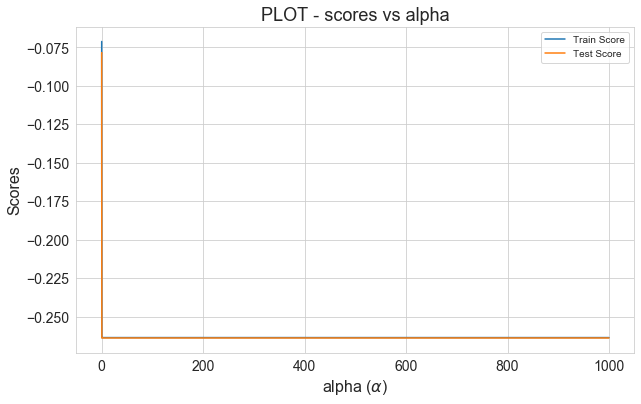

In [223]:
#plotting mean test and train scores with different alpha

plt.figure(figsize=(10,6))
plt.plot('param_alpha','mean_train_score', data = lasso_df)
plt.plot('param_alpha', 'mean_test_score', data = lasso_df)
plt.xlabel("alpha ($\\alpha$)")
plt.ylabel("Scores")

plt.title("PLOT - scores vs alpha")
plt.legend(['Train Score', 'Test Score'])
plt.show()

In [224]:
lass0_beta = pd.DataFrame(index = X_train_rfe.columns)

In [225]:
lass0_beta.rows = X_train_rfe.columns

In [226]:
lass0_beta['Lasso'] = lasso.coef_
lass0_beta['abs_lass'] = abs(lasso.coef_)

In [227]:
lass0_beta.sort_values('abs_lass', ascending=False)

#top 5 features are:
#KitchenQual_TA, TotalBsmtSF, GarageArea, MSZoning_RL, HalfBath

,Lasso,abs_lass
KitchenQual_TA,-0.0996,0.0996
TotalBsmtSF,0.0935,0.0935
GarageArea,0.0668,0.0668
MSZoning_RL,0.0622,0.0622
HalfBath,0.0607,0.0607
KitchenQual_Gd,-0.0571,0.0571
KitchenQual_Fa,-0.0445,0.0445
Foundation_PConc,0.0431,0.0431
MSZoning_RM,0.0413,0.0413
Neighborhood_Crawfor,0.0392,0.0392
